# Adım 1: Kvasir-SEG Veri Seti Keşfi
## U-Net ile Polip Segmentasyonu - Final Projesi

Bu notebook'ta sadece veri setini indirip tanıyacağız:
- Klasör yapısı
- Görüntü ve maske örnekleri
- Boyut dağılımları
- Polip/arka plan oranları
- İstatistikler

## 1.1 Kaggle API Kurulumu ve Dataset İndirme

In [ ]:
# Kaggle API kurulumu
!pip install -q kaggle

In [ ]:
# kaggle.json dosyanizi yukleyin
from google.colab import files
files.upload()  # kaggle.json secin

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kumrunaztunaboylu","key":"a55f8dc0fe0a4568b3bbe1d5013633dc"}'}

In [ ]:
# API yapilandirmasi
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Dataset indir
!kaggle datasets download -d debeshjha1/kvasirseg
!unzip -q kvasirseg.zip -d kvasir_seg/

print("\nIndirme tamamlandi!")

Dataset URL: https://www.kaggle.com/datasets/debeshjha1/kvasirseg
License(s): copyright-authors
100% 144M/144M [00:00<00:00, 155MB/s]


Indirme tamamlandi!


## 1.2 Klasör Yapısını İnceleme

In [ ]:
import os

# Klasor yapisini goster
for root, dirs, files_list in os.walk('kvasir_seg/'):
    level = root.replace('kvasir_seg/', '').count(os.sep)
    indent = '  ' * level
    print(f'{indent}{os.path.basename(root)}/')
    if level < 2:
        subindent = '  ' * (level + 1)
        for f in sorted(files_list)[:3]:
            print(f'{subindent}{f}')
        if len(files_list) > 3:
            print(f'{subindent}... ve {len(files_list)-3} dosya daha')
        print(f'{subindent}TOPLAM: {len(files_list)} dosya')

In [ ]:
# Gercek klasor yollarini bul
# (Dataset yapisina gore otomatik tespit)
from glob import glob

# Olasi yollar
possible_image_dirs = glob('kvasir_seg/**/images', recursive=True)
possible_mask_dirs = glob('kvasir_seg/**/masks', recursive=True)

print("Bulunan image klasorleri:", possible_image_dirs)
print("Bulunan mask klasorleri:", possible_mask_dirs)

# Yollari ayarla
IMAGE_DIR = possible_image_dirs[0] + '/'
MASK_DIR = possible_mask_dirs[0] + '/'

print(f"\nKullanilacak yollar:")
print(f"  Goruntu: {IMAGE_DIR}")
print(f"  Maske:   {MASK_DIR}")

Bulunan image klasorleri: []
Bulunan mask klasorleri: []


IndexError: list index out of range

In [ ]:
# Goruntu ve maske dosyalarini topla
image_paths = sorted(glob(IMAGE_DIR + '*.jpg') + glob(IMAGE_DIR + '*.png'))
mask_paths = sorted(glob(MASK_DIR + '*.jpg') + glob(MASK_DIR + '*.png'))

print(f"Toplam goruntu: {len(image_paths)}")
print(f"Toplam maske:   {len(mask_paths)}")

# Eslesme kontrolu
img_names = set([os.path.basename(p).split('.')[0] for p in image_paths])
mask_names = set([os.path.basename(p).split('.')[0] for p in mask_paths])
matched = img_names & mask_names
print(f"Eslesen cift: {len(matched)}")

if img_names - mask_names:
    print(f"UYARI: {len(img_names - mask_names)} goruntunun maskesi yok!")
if mask_names - img_names:
    print(f"UYARI: {len(mask_names - img_names)} maskenin goruntusu yok!")

Toplam goruntu: 1000
Toplam maske:   1000
Eslesen cift: 1000


## 1.3 Örnek Görüntüleri İnceleme

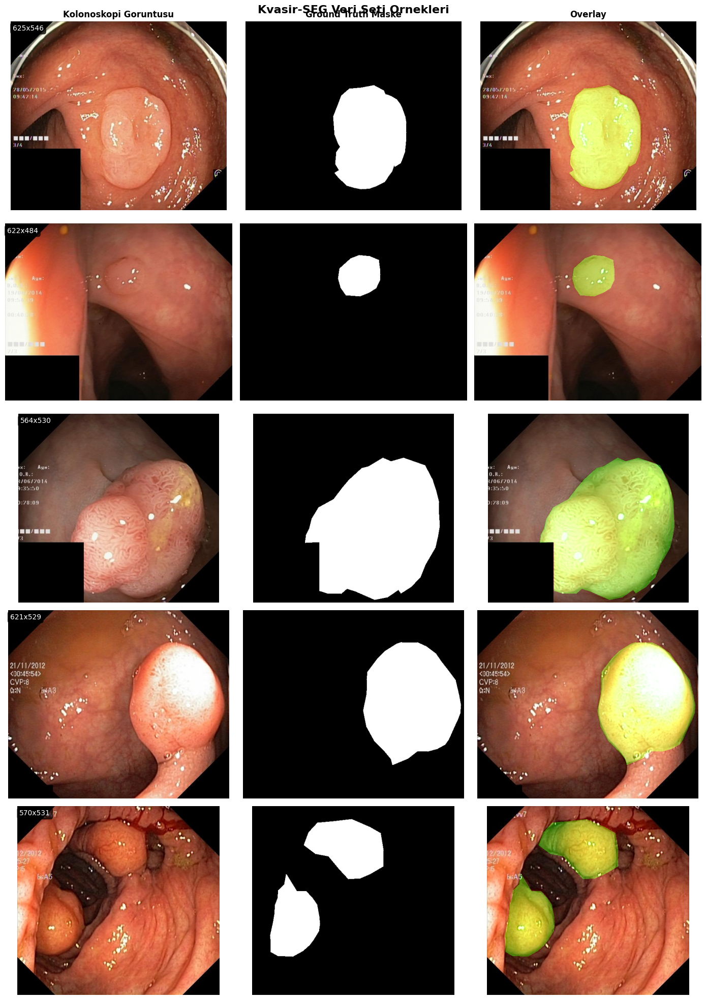

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 5 rastgele ornek goster
fig, axes = plt.subplots(5, 3, figsize=(14, 20))
fig.suptitle('Kvasir-SEG Veri Seti Ornekleri', fontsize=16, fontweight='bold')

axes[0, 0].set_title('Kolonoskopi Goruntusu', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Ground Truth Maske', fontsize=12, fontweight='bold')
axes[0, 2].set_title('Overlay', fontsize=12, fontweight='bold')

np.random.seed(42)
indices = np.random.choice(len(image_paths), 5, replace=False)

for i, idx in enumerate(indices):
    # Goruntu oku (BGR -> RGB)
    img = cv2.imread(image_paths[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Maske oku
    mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)

    # Orijinal goruntu
    axes[i, 0].imshow(img)
    axes[i, 0].set_ylabel(f'#{idx}', fontsize=11)
    axes[i, 0].axis('off')

    # Maske
    axes[i, 1].imshow(mask, cmap='gray')
    axes[i, 1].axis('off')

    # Overlay (yesil kanal uzerine maske)
    overlay = img.copy()
    mask_bool = mask > 127
    overlay[mask_bool, 1] = np.clip(overlay[mask_bool, 1].astype(int) + 100, 0, 255)
    axes[i, 2].imshow(overlay)
    axes[i, 2].axis('off')

    # Boyut bilgisi
    axes[i, 0].text(5, 25, f'{img.shape[1]}x{img.shape[0]}',
                     color='white', fontsize=10,
                     bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

plt.tight_layout()
plt.savefig('ornekler.png', dpi=150, bbox_inches='tight')
plt.show()

## 1.4 Boyut Dağılımı Analizi

In [ ]:
from tqdm import tqdm

# Tum goruntulerin boyutlarini topla
widths = []
heights = []

for p in tqdm(image_paths, desc='Boyutlar okunuyor'):
    img = cv2.imread(p)
    h, w = img.shape[:2]
    widths.append(w)
    heights.append(h)

widths = np.array(widths)
heights = np.array(heights)

print("\n" + "=" * 50)
print("GORUNTU BOYUT ISTATISTIKLERI")
print("=" * 50)
print(f"Genislik  -> Min: {widths.min()}, Max: {widths.max()}, Ort: {widths.mean():.0f}")
print(f"Yukseklik -> Min: {heights.min()}, Max: {heights.max()}, Ort: {heights.mean():.0f}")
print(f"Benzersiz boyutlar: {len(set(zip(widths, heights)))}")
print("=" * 50)

Boyutlar okunuyor: 100%|██████████| 1000/1000 [00:03<00:00, 330.82it/s]


GORUNTU BOYUT ISTATISTIKLERI
Genislik  -> Min: 332, Max: 1920, Ort: 625
Yukseklik -> Min: 352, Max: 1072, Ort: 545
Benzersiz boyutlar: 333


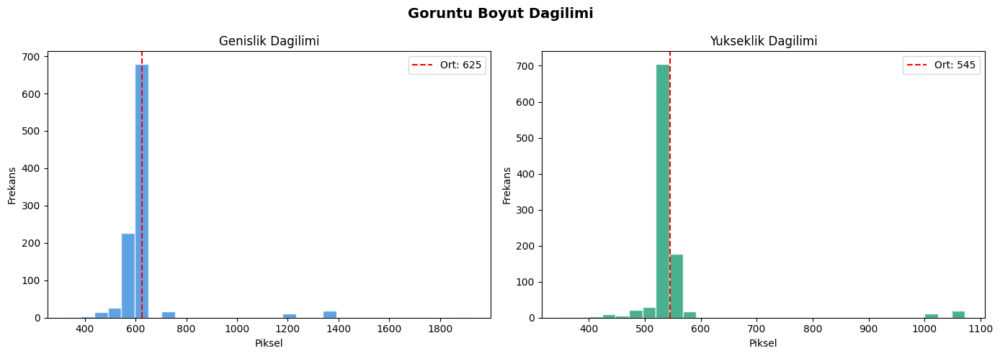

In [ ]:
# Boyut dagilimi grafigi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Goruntu Boyut Dagilimi', fontsize=14, fontweight='bold')

axes[0].hist(widths, bins=30, color='#378ADD', edgecolor='white', alpha=0.8)
axes[0].set_title('Genislik Dagilimi')
axes[0].set_xlabel('Piksel')
axes[0].set_ylabel('Frekans')
axes[0].axvline(widths.mean(), color='red', linestyle='--', label=f'Ort: {widths.mean():.0f}')
axes[0].legend()

axes[1].hist(heights, bins=30, color='#1D9E75', edgecolor='white', alpha=0.8)
axes[1].set_title('Yukseklik Dagilimi')
axes[1].set_xlabel('Piksel')
axes[1].set_ylabel('Frekans')
axes[1].axvline(heights.mean(), color='red', linestyle='--', label=f'Ort: {heights.mean():.0f}')
axes[1].legend()

plt.tight_layout()
plt.savefig('boyut_dagilimi.png', dpi=150, bbox_inches='tight')
plt.show()

## 1.5 Polip/Arka Plan Oranı Analizi

Bu çok önemli bir analiz: her görüntüde polipin kapladığı alanı ölçeceğiz.
Bu oran, loss fonksiyonu seçimimizi doğrudan etkiler.

In [ ]:
# Her goruntude polip oranini hesapla
polyp_ratios = []

for p in tqdm(mask_paths, desc='Maske oranlari hesaplaniyor'):
    mask = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    total_pixels = mask.shape[0] * mask.shape[1]
    polyp_pixels = np.sum(mask > 127)
    ratio = polyp_pixels / total_pixels
    polyp_ratios.append(ratio)

polyp_ratios = np.array(polyp_ratios)

print("\n" + "=" * 50)
print("POLIP / ARKA PLAN ORAN ANALIZI")
print("=" * 50)
print(f"Ortalama polip orani: %{polyp_ratios.mean()*100:.1f}")
print(f"Minimum polip orani:  %{polyp_ratios.min()*100:.1f}")
print(f"Maksimum polip orani: %{polyp_ratios.max()*100:.1f}")
print(f"Medyan polip orani:   %{np.median(polyp_ratios)*100:.1f}")
print(f"\nCok kucuk polipler (<%5):  {np.sum(polyp_ratios < 0.05)} goruntu")
print(f"Orta polipler (%5-%30):    {np.sum((polyp_ratios >= 0.05) & (polyp_ratios < 0.30))} goruntu")
print(f"Buyuk polipler (>%30):     {np.sum(polyp_ratios >= 0.30)} goruntu")
print("=" * 50)

Maske oranlari hesaplaniyor: 100%|██████████| 1000/1000 [00:00<00:00, 1356.96it/s]


POLIP / ARKA PLAN ORAN ANALIZI
Ortalama polip orani: %15.4
Minimum polip orani:  %0.5
Maksimum polip orani: %81.2
Medyan polip orani:   %11.4

Cok kucuk polipler (<%5):  200 goruntu
Orta polipler (%5-%30):    669 goruntu
Buyuk polipler (>%30):     131 goruntu


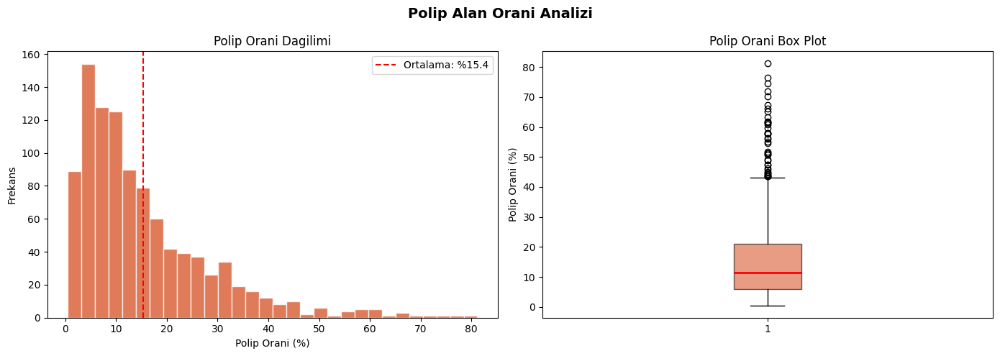

In [ ]:
# Polip orani dagilimi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Polip Alan Orani Analizi', fontsize=14, fontweight='bold')

# Histogram
axes[0].hist(polyp_ratios * 100, bins=30, color='#D85A30', edgecolor='white', alpha=0.8)
axes[0].axvline(polyp_ratios.mean() * 100, color='red', linestyle='--',
                label=f'Ortalama: %{polyp_ratios.mean()*100:.1f}')
axes[0].set_title('Polip Orani Dagilimi')
axes[0].set_xlabel('Polip Orani (%)')
axes[0].set_ylabel('Frekans')
axes[0].legend()

# Box plot
axes[1].boxplot(polyp_ratios * 100, vert=True, patch_artist=True,
                boxprops=dict(facecolor='#D85A30', alpha=0.6),
                medianprops=dict(color='red', linewidth=2))
axes[1].set_title('Polip Orani Box Plot')
axes[1].set_ylabel('Polip Orani (%)')

plt.tight_layout()
plt.savefig('polip_oran_analizi.png', dpi=150, bbox_inches='tight')
plt.show()

## 1.6 Piksel Değer Dağılımı

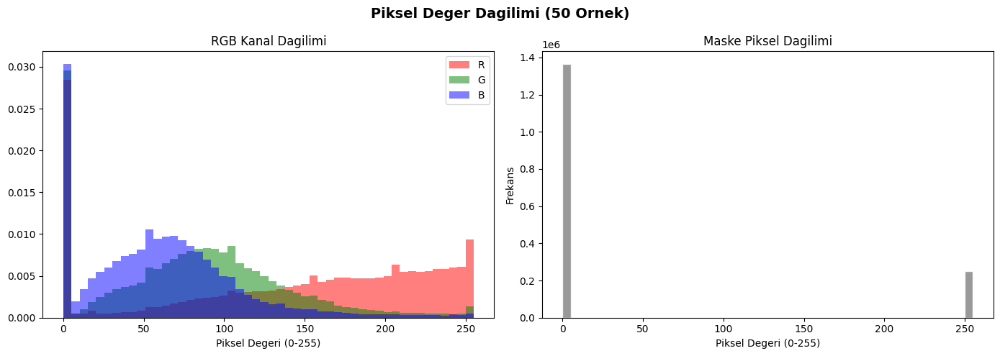


Maskelerdeki benzersiz deger sayisi: 18
Min: 0, Max: 255
NOT: Maskeler tam binary degil, threshold uygulanmali!


In [ ]:
# 50 rastgele goruntunun piksel dagilimi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Piksel Deger Dagilimi (50 Ornek)', fontsize=14, fontweight='bold')

sample_indices = np.random.choice(len(image_paths), 50, replace=False)

all_r, all_g, all_b = [], [], []
all_mask_vals = []

for idx in sample_indices:
    img = cv2.imread(image_paths[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)

    all_r.extend(img[:,:,0].flatten()[::10])  # her 10. piksel (hiz icin)
    all_g.extend(img[:,:,1].flatten()[::10])
    all_b.extend(img[:,:,2].flatten()[::10])
    all_mask_vals.extend(mask.flatten()[::10])

# RGB dagilimi
axes[0].hist(all_r, bins=50, alpha=0.5, color='red', label='R', density=True)
axes[0].hist(all_g, bins=50, alpha=0.5, color='green', label='G', density=True)
axes[0].hist(all_b, bins=50, alpha=0.5, color='blue', label='B', density=True)
axes[0].set_title('RGB Kanal Dagilimi')
axes[0].set_xlabel('Piksel Degeri (0-255)')
axes[0].legend()

# Maske dagilimi
axes[1].hist(all_mask_vals, bins=50, color='gray', edgecolor='white', alpha=0.8)
axes[1].set_title('Maske Piksel Dagilimi')
axes[1].set_xlabel('Piksel Degeri (0-255)')
axes[1].set_ylabel('Frekans')

plt.tight_layout()
plt.savefig('piksel_dagilimi.png', dpi=150, bbox_inches='tight')
plt.show()

# Maskelerin binary olup olmadigini kontrol et
unique_vals = np.unique(all_mask_vals)
print(f"\nMaskelerdeki benzersiz deger sayisi: {len(unique_vals)}")
if len(unique_vals) <= 10:
    print(f"Degerler: {unique_vals}")
else:
    print(f"Min: {unique_vals.min()}, Max: {unique_vals.max()}")
    print("NOT: Maskeler tam binary degil, threshold uygulanmali!")

## 1.7 Özet ve Sonraki Adım

In [ ]:
print("\n" + "=" * 60)
print("  KVASIR-SEG VERI SETI OZETI")
print("=" * 60)
print(f"  Toplam goruntu-maske cifti: {len(matched)}")
print(f"  Goruntu tipi:              RGB (3 kanal)")
print(f"  Boyut araligi:             {widths.min()}x{heights.min()} - {widths.max()}x{heights.max()}")
print(f"  Ortalama polip orani:      %{polyp_ratios.mean()*100:.1f}")
print(f"  Maske tipi:                {'Binary' if len(unique_vals) <= 5 else 'Threshold gerekli'}")
print("=" * 60)
print("\n  SONRAKI ADIM:")
print("  -> Veri On Isleme (resize, normalize, augmentation)")
print("  -> Train/Val/Test split")
print("  -> tf.data pipeline olusturma")
print("=" * 60)


  KVASIR-SEG VERI SETI OZETI
  Toplam goruntu-maske cifti: 1000
  Goruntu tipi:              RGB (3 kanal)
  Boyut araligi:             332x352 - 1920x1072
  Ortalama polip orani:      %15.4
  Maske tipi:                Threshold gerekli

  SONRAKI ADIM:
  -> Veri On Isleme (resize, normalize, augmentation)
  -> Train/Val/Test split
  -> tf.data pipeline olusturma


# Adim 2: Veri On Isleme, Augmentation ve Pipeline
## U-Net ile Polip Segmentasyonu - Final Projesi

Bu notebook'ta:
- Adim 1'deki dataset'i yukleyecegiz
- Resize, normalize, threshold islemleri
- Train / Validation / Test bolme
- Data Augmentation stratejisi
- tf.data pipeline olusturma
- Islenmis verinin gorsel dogrulamasi

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()  # kaggle.json

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"kumrunaztunaboylu","key":"a55f8dc0fe0a4568b3bbe1d5013633dc"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d debeshjha1/kvasirseg
!unzip -q kvasirseg.zip -d kvasir_seg/
print("Dataset hazir!")

Dataset URL: https://www.kaggle.com/datasets/debeshjha1/kvasirseg
License(s): copyright-authors
kvasirseg.zip: Skipping, found more recently modified local copy (use --force to force download)
replace kvasir_seg/Kvasir-SEG/Kvasir-SEG/1911.07069.pdf? [y]es, [n]o, [A]ll, [N]one, [r]ename: Dataset hazir!


In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

print("TensorFlow:", tf.__version__)
print("GPU:", tf.config.list_physical_devices('GPU'))

# Yollar
IMAGE_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/images/'
MASK_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/masks/'

image_paths = sorted(glob(IMAGE_DIR + '*.jpg') + glob(IMAGE_DIR + '*.png'))
mask_paths = sorted(glob(MASK_DIR + '*.jpg') + glob(MASK_DIR + '*.png'))
print(f"Goruntu: {len(image_paths)}, Maske: {len(mask_paths)}")

TensorFlow: 2.20.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Goruntu: 1000, Maske: 1000


## 2.2 Sabitleri Belirleme

Adim 1'deki analizlere gore kararlarimiz:
- **IMG_SIZE = 256**: 333 farkli boyut vardi, hepsini 256x256'ya resize edecegiz
- **BATCH_SIZE = 16**: Colab T4 (16GB VRAM) icin uygun
- **Threshold = 127**: Maskeler tam binary degildi, >127 olan pikseller polip olacak

In [ ]:
# ===== PROJE SABITLERI =====
IMG_SIZE = 256       # Adim 1: boyutlar 332-1920 arasi, 256 optimal
BATCH_SIZE = 16      # T4 GPU icin uygun
SEED = 42            # Tekrarlanabilirlik icin

np.random.seed(SEED)
tf.random.set_seed(SEED)

print(f"Goruntu boyutu: {IMG_SIZE}x{IMG_SIZE}")
print(f"Batch boyutu:   {BATCH_SIZE}")
print(f"Random seed:    {SEED}")

Goruntu boyutu: 256x256
Batch boyutu:   16
Random seed:    42


## 2.3 Veri Yukleme ve On Isleme

Her goruntu icin 3 islem yapacagiz:
1. **Resize**: Farkli boyutlari 256x256'ya getir
2. **Normalize**: Piksel degerlerini [0,1] araligina cek (/255.0)
3. **Threshold**: Maskeleri binary yap (>127 → 1, degilse → 0)

In [ ]:
def load_and_preprocess(image_path, mask_path):
    """
    Tek bir goruntu-maske ciftini oku ve isle.

    Adimlar:
    1. cv2 ile oku (goruntu BGR, maske grayscale)
    2. BGR -> RGB donusumu (goruntu icin)
    3. 256x256 resize (INTER_AREA: kucultme icin en iyi interpolasyon)
    4. /255.0 ile [0,1] araligina normalize
    5. Maske icin >0.5 threshold (binary: 0 veya 1)
    """
    # Goruntu: BGR olarak oku, RGB'ye cevir, resize, normalize
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0

    # Maske: grayscale oku, resize, normalize, threshold
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask.astype(np.float32) / 255.0
    mask = (mask > 0.5).astype(np.float32)  # binary threshold

    return img, mask

print("Fonksiyon tanimlandi.")
print("NOT: Maske resize icin INTER_NEAREST kullaniyoruz,")
print("     cunku interpolasyon maske kenarlarini bozabilir.")

Fonksiyon tanimlandi.
NOT: Maske resize icin INTER_NEAREST kullaniyoruz,
     cunku interpolasyon maske kenarlarini bozabilir.


On isleme testi:
  Goruntu shape: (256, 256, 3)
  Goruntu dtype: float32
  Goruntu min/max: [0.000, 1.000]
  Maske shape:   (256, 256)
  Maske dtype:   float32
  Maske benzersiz degerler: [0. 1.]


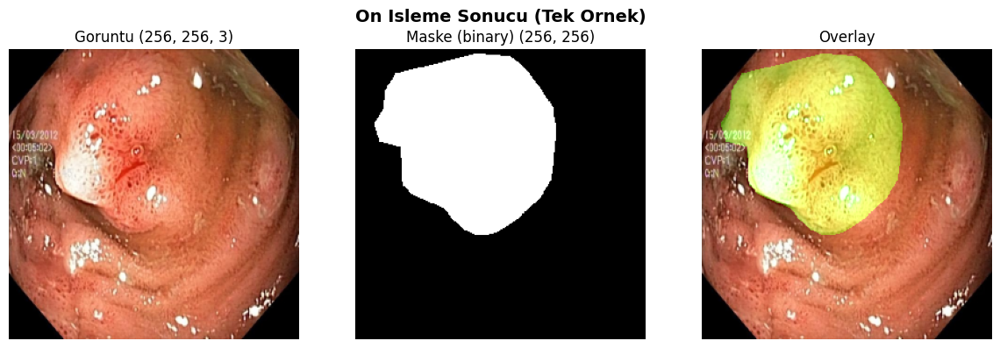


On isleme dogru calisiyor!


In [ ]:
# Tek bir ornek uzerinde test edelim
test_img, test_mask = load_and_preprocess(image_paths[0], mask_paths[0])

print("On isleme testi:")
print(f"  Goruntu shape: {test_img.shape}")
print(f"  Goruntu dtype: {test_img.dtype}")
print(f"  Goruntu min/max: [{test_img.min():.3f}, {test_img.max():.3f}]")
print(f"  Maske shape:   {test_mask.shape}")
print(f"  Maske dtype:   {test_mask.dtype}")
print(f"  Maske benzersiz degerler: {np.unique(test_mask)}")

# Gorsellestir
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
fig.suptitle('On Isleme Sonucu (Tek Ornek)', fontsize=14, fontweight='bold')

axes[0].imshow(test_img)
axes[0].set_title(f'Goruntu {test_img.shape}')
axes[0].axis('off')

axes[1].imshow(test_mask, cmap='gray')
axes[1].set_title(f'Maske (binary) {test_mask.shape}')
axes[1].axis('off')

# Overlay
overlay = test_img.copy()
overlay[test_mask > 0.5, 1] = np.clip(overlay[test_mask > 0.5, 1] + 0.4, 0, 1)
axes[2].imshow(overlay)
axes[2].set_title('Overlay')
axes[2].axis('off')

plt.tight_layout()
plt.show()
print("\nOn isleme dogru calisiyor!")

In [ ]:
# ===== TUM VERIYI YUKLE =====
print("Tum veriler yukleniyor ve isleniyor...")

X_data = []  # goruntuler
Y_data = []  # maskeler

for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
    img, mask = load_and_preprocess(img_path, mask_path)
    X_data.append(img)
    Y_data.append(mask)

# Numpy array'e cevir
X_data = np.array(X_data)                    # (1000, 256, 256, 3)
Y_data = np.array(Y_data)[..., np.newaxis]   # (1000, 256, 256, 1)

print(f"\nGoruntuler: {X_data.shape} | dtype: {X_data.dtype}")
print(f"Maskeler:   {Y_data.shape} | dtype: {Y_data.dtype}")
print(f"Goruntu deger araligi: [{X_data.min():.2f}, {X_data.max():.2f}]")
print(f"Maske benzersiz degerler: {np.unique(Y_data)}")
print(f"\nBellekte kaplanan alan: {(X_data.nbytes + Y_data.nbytes) / 1e9:.2f} GB")

Tum veriler yukleniyor ve isleniyor...


100%|██████████| 1000/1000 [00:07<00:00, 142.37it/s]



Goruntuler: (1000, 256, 256, 3) | dtype: float32
Maskeler:   (1000, 256, 256, 1) | dtype: float32
Goruntu deger araligi: [0.00, 1.00]
Maske benzersiz degerler: [0. 1.]

Bellekte kaplanan alan: 1.05 GB


## 2.4 Train / Validation / Test Bolme

Veriyi 3'e bolecegiz:
- **%70 Egitim (700 goruntu)**: Model bunlardan ogrenir
- **%15 Dogrulama (150 goruntu)**: Egitim sirasinda overfitting kontrolu
- **%15 Test (150 goruntu)**: Final degerlendirme, model bunu hic gormez

Neden %70-%15-%15? 1000 goruntu orta buyuklukte bir dataset.
%80-%20 bolsek test seti cok kucuk kalir, %60-%20-%20 bolsek egitim verisi az kalir.

In [ ]:
# Ilk bolme: %70 train, %30 gecici
X_train, X_temp, Y_train, Y_temp = train_test_split(
    X_data, Y_data,
    test_size=0.30,
    random_state=SEED
)

# Ikinci bolme: geciciyi %50-%50 (yani toplamin %15-%15)
X_val, X_test, Y_val, Y_test = train_test_split(
    X_temp, Y_temp,
    test_size=0.50,
    random_state=SEED
)

print("=" * 50)
print("VERI BOLME SONUCU")
print("=" * 50)
print(f"Egitim seti:    {X_train.shape[0]} goruntu ({X_train.shape[0]/len(X_data)*100:.0f}%)")
print(f"Dogrulama seti: {X_val.shape[0]} goruntu ({X_val.shape[0]/len(X_data)*100:.0f}%)")
print(f"Test seti:      {X_test.shape[0]} goruntu ({X_test.shape[0]/len(X_data)*100:.0f}%)")
print("=" * 50)

VERI BOLME SONUCU
Egitim seti:    700 goruntu (70%)
Dogrulama seti: 150 goruntu (15%)
Test seti:      150 goruntu (15%)


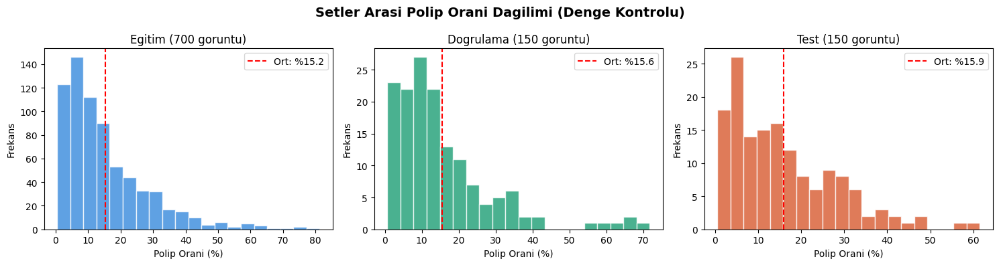

Ortalama polip orani -> Egitim: %15.2 | Dogrulama: %15.6 | Test: %15.9
Eger oranlar birbirine yakinsa bolme dengelidir.


In [ ]:
# Her setteki polip orani dagilimini kontrol et
# (Bolme dengeli mi? Kucuk polipler sadece bir sette mi toplanmis?)

def calc_polyp_ratio(masks):
    """Her goruntudeki polip oranini hesapla"""
    ratios = []
    for i in range(len(masks)):
        ratio = masks[i].mean()  # zaten 0-1 arasi, mean = polip orani
        ratios.append(ratio)
    return np.array(ratios)

train_ratios = calc_polyp_ratio(Y_train)
val_ratios = calc_polyp_ratio(Y_val)
test_ratios = calc_polyp_ratio(Y_test)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle('Setler Arasi Polip Orani Dagilimi (Denge Kontrolu)', fontsize=14, fontweight='bold')

for ax, ratios, name, color in zip(axes,
    [train_ratios, val_ratios, test_ratios],
    ['Egitim', 'Dogrulama', 'Test'],
    ['#378ADD', '#1D9E75', '#D85A30']):

    ax.hist(ratios * 100, bins=20, color=color, edgecolor='white', alpha=0.8)
    ax.axvline(ratios.mean() * 100, color='red', linestyle='--',
               label=f'Ort: %{ratios.mean()*100:.1f}')
    ax.set_title(f'{name} ({len(ratios)} goruntu)')
    ax.set_xlabel('Polip Orani (%)')
    ax.set_ylabel('Frekans')
    ax.legend()

plt.tight_layout()
plt.savefig('set_denge_kontrolu.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Ortalama polip orani -> Egitim: %{train_ratios.mean()*100:.1f} | "
      f"Dogrulama: %{val_ratios.mean()*100:.1f} | Test: %{test_ratios.mean()*100:.1f}")
print("Eger oranlar birbirine yakinsa bolme dengelidir.")

## 2.5 Data Augmentation

Neden augmentation?
- 700 egitim goruntusu yeterli ama daha fazlasi daha iyi
- Model farkli acilardan, farkli parlaklikta polipleri gormeli

**Kritik kural**: Goruntu ve maskeye **AYNI** geometrik donusum uygulanmali!
- Goruntuyu cevirirsen maskeyi de cevir
- Ama parlaklik/kontrast sadece goruntuye uygulanir (maske etkilenmez)

In [ ]:
def augment(image, mask):
    """
    Goruntu ve maskeye augmentation uygula.

    Geometrik donusumler (ikisine de):
    - Rastgele yatay cevirme
    - Rastgele dikey cevirme

    Renk donusumleri (sadece goruntuye):
    - Rastgele parlaklik
    - Rastgele kontrast
    - Rastgele doygunluk (saturation)
    """
    # ===== GEOMETRIK (ikisine de ayni) =====
    # Yatay cevirme (%50 olasilik)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

    # Dikey cevirme (%50 olasilik)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # ===== RENK (sadece goruntu) =====
    image = tf.image.random_brightness(image, max_delta=0.15)
    image = tf.image.random_contrast(image, lower=0.85, upper=1.15)
    image = tf.image.random_saturation(image, lower=0.85, upper=1.15)

    # Degerleri [0, 1] araliginda tut
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image, mask

print("Augmentation fonksiyonu tanimlandi.")

Augmentation fonksiyonu tanimlandi.


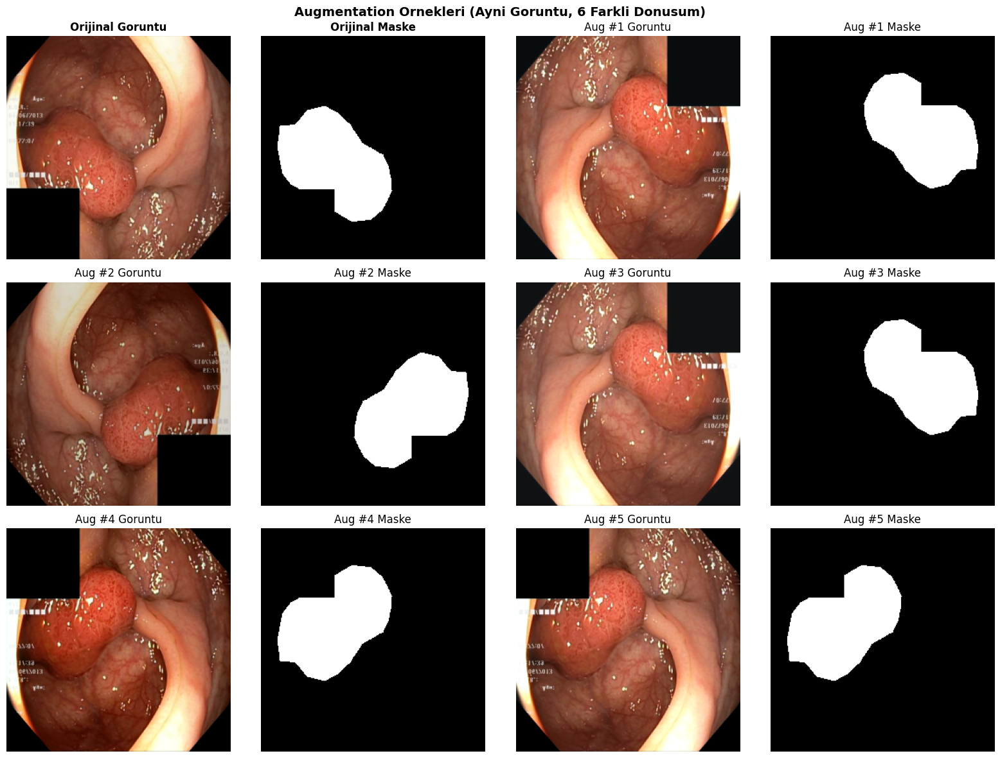

Kontrol et: Goruntu ve maske ayni sekilde donmus mu?
Flip yapildiginda maske de flip olmus olmali!


In [ ]:
# Augmentation'i gorsel olarak dogrula
# Ayni goruntuye 6 kere augmentation uygulayalim

sample_img = X_train[0]
sample_mask = Y_train[0]

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Augmentation Ornekleri (Ayni Goruntu, 6 Farkli Donusum)',
             fontsize=14, fontweight='bold')

# Orijinal
axes[0, 0].imshow(sample_img)
axes[0, 0].set_title('Orijinal Goruntu', fontweight='bold')
axes[0, 0].axis('off')
axes[0, 1].imshow(sample_mask[:,:,0], cmap='gray')
axes[0, 1].set_title('Orijinal Maske', fontweight='bold')
axes[0, 1].axis('off')

# 5 farkli augmentation
positions = [(0,2), (0,3), (1,0), (1,1), (1,2), (1,3), (2,0), (2,1), (2,2), (2,3)]
for k in range(5):
    aug_img, aug_mask = augment(
        tf.constant(sample_img),
        tf.constant(sample_mask)
    )
    r, c = positions[k*2], positions[k*2+1]
    axes[r[0], r[1]].imshow(aug_img.numpy())
    axes[r[0], r[1]].set_title(f'Aug #{k+1} Goruntu')
    axes[r[0], r[1]].axis('off')
    axes[c[0], c[1]].imshow(aug_mask.numpy()[:,:,0], cmap='gray')
    axes[c[0], c[1]].set_title(f'Aug #{k+1} Maske')
    axes[c[0], c[1]].axis('off')

plt.tight_layout()
plt.savefig('augmentation_ornekleri.png', dpi=150, bbox_inches='tight')
plt.show()

print("Kontrol et: Goruntu ve maske ayni sekilde donmus mu?")
print("Flip yapildiginda maske de flip olmus olmali!")

## 2.6 tf.data Pipeline Olusturma

Neden tf.data?
- GPU egitim yaparken, CPU bir sonraki batch'i hazirlar (paralel calisma)
- `prefetch` ve `shuffle` ile egitim hizi artar
- Augmentation sadece egitim setine uygulanir (val ve test'e degil!)

In [ ]:
# ===== TF.DATA PIPELINE =====

# EGITIM seti: shuffle + augmentation + batch + prefetch
train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = (
    train_ds
    .shuffle(buffer_size=500, seed=SEED)   # verileri karistir
    .map(augment, num_parallel_calls=tf.data.AUTOTUNE)  # augmentation
    .batch(BATCH_SIZE)                      # 16'li gruplar
    .prefetch(tf.data.AUTOTUNE)             # CPU/GPU paralel calisma
)

# DOGRULAMA seti: sadece batch + prefetch (augmentation YOK)
val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
val_ds = (
    val_ds
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

# TEST seti: sadece batch + prefetch (augmentation YOK)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
test_ds = (
    test_ds
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

print("Pipeline olusturuldu!")
print(f"  Egitim:    {tf.data.experimental.cardinality(train_ds).numpy()} batch")
print(f"  Dogrulama: {tf.data.experimental.cardinality(val_ds).numpy()} batch")
print(f"  Test:      {tf.data.experimental.cardinality(test_ds).numpy()} batch")

Pipeline olusturuldu!
  Egitim:    44 batch
  Dogrulama: 10 batch
  Test:      10 batch


Batch goruntu shape: (16, 256, 256, 3)
Batch maske shape:   (16, 256, 256, 1)
Goruntu deger araligi: [0.000, 1.000]
Maske benzersiz: [0. 1.]


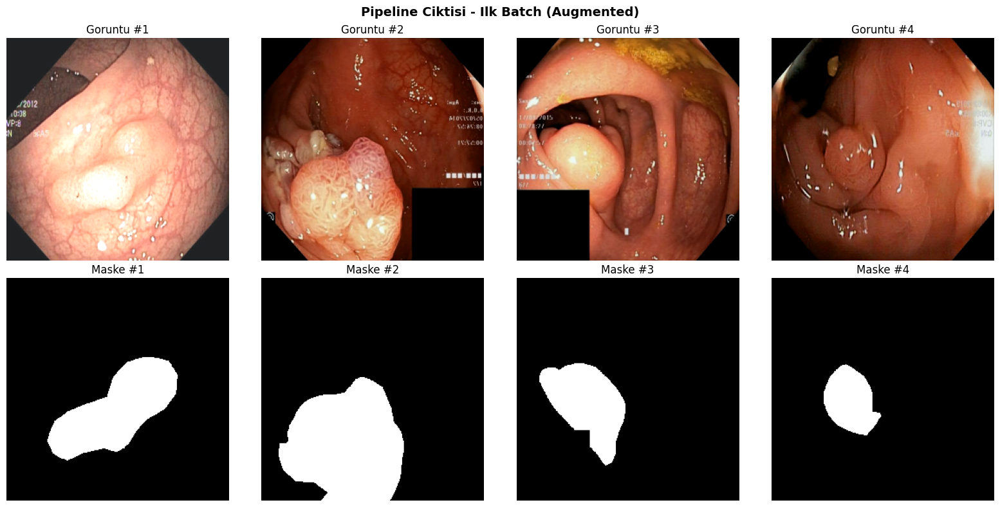

In [ ]:
# Pipeline'dan bir batch cekip kontrol edelim
for batch_imgs, batch_masks in train_ds.take(1):
    print(f"Batch goruntu shape: {batch_imgs.shape}")
    print(f"Batch maske shape:   {batch_masks.shape}")
    print(f"Goruntu deger araligi: [{batch_imgs.numpy().min():.3f}, {batch_imgs.numpy().max():.3f}]")
    print(f"Maske benzersiz: {np.unique(batch_masks.numpy())}")

# Batch'ten 4 ornek goster
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Pipeline Ciktisi - Ilk Batch (Augmented)', fontsize=14, fontweight='bold')

for i in range(4):
    axes[0, i].imshow(batch_imgs[i].numpy())
    axes[0, i].set_title(f'Goruntu #{i+1}')
    axes[0, i].axis('off')

    axes[1, i].imshow(batch_masks[i].numpy()[:,:,0], cmap='gray')
    axes[1, i].set_title(f'Maske #{i+1}')
    axes[1, i].axis('off')

plt.tight_layout()
plt.savefig('pipeline_ciktisi.png', dpi=150, bbox_inches='tight')
plt.show()

## 2.7 Ozet ve Sonraki Adim

In [ ]:
print("\n" + "=" * 60)
print("  ADIM 2 OZETI - VERI ON ISLEME")
print("=" * 60)
print(f"  Resize:          {IMG_SIZE}x{IMG_SIZE}")
print(f"  Normalize:       /255.0 -> [0, 1]")
print(f"  Maske threshold: >0.5 -> binary (0 veya 1)")
print(f"  Maske resize:    INTER_NEAREST (kenar koruma)")
print(f"")
print(f"  Egitim:          {X_train.shape[0]} goruntu (augmented)")
print(f"  Dogrulama:       {X_val.shape[0]} goruntu")
print(f"  Test:            {X_test.shape[0]} goruntu")
print(f"")
print(f"  Augmentation:    Flip (H+V), Brightness, Contrast, Saturation")
print(f"  Pipeline:        tf.data (shuffle + prefetch)")
print(f"  Batch size:      {BATCH_SIZE}")
print("=" * 60)
print("\n  SONRAKI ADIM:")
print("  -> U-Net modelini olusturma")
print("  -> Loss fonksiyonu ve metrikler")
print("  -> Egitim")
print("=" * 60)


  ADIM 2 OZETI - VERI ON ISLEME
  Resize:          256x256
  Normalize:       /255.0 -> [0, 1]
  Maske threshold: >0.5 -> binary (0 veya 1)
  Maske resize:    INTER_NEAREST (kenar koruma)

  Egitim:          700 goruntu (augmented)
  Dogrulama:       150 goruntu
  Test:            150 goruntu

  Augmentation:    Flip (H+V), Brightness, Contrast, Saturation
  Pipeline:        tf.data (shuffle + prefetch)
  Batch size:      16

  SONRAKI ADIM:
  -> U-Net modelini olusturma
  -> Loss fonksiyonu ve metrikler
  -> Egitim


# Adim 3: U-Net Modeli, Egitim ve Degerlendirme
## U-Net ile Polip Segmentasyonu - Final Projesi

Bu notebook'ta:
- U-Net mimarisini sifirdan kuracagiz
- Loss fonksiyonlari (BCE + Dice Loss)
- Egitim (callbacks ile)
- Degerlendirme ve gorsellistirme
- Sonuc raporu

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()  # kaggle.json

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kumrunaztunaboylu","key":"a55f8dc0fe0a4568b3bbe1d5013633dc"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d debeshjha1/kvasirseg
!unzip -q kvasirseg.zip -d kvasir_seg/
print("Dataset hazir!")

Dataset URL: https://www.kaggle.com/datasets/debeshjha1/kvasirseg
License(s): copyright-authors
100% 144M/144M [00:00<00:00, 181MB/s]

Dataset hazir!


In [ ]:
# ===== ADIM 1-2 TEKRAR: Kutuphaneler + On Isleme + Pipeline =====
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

# Sabitler
IMG_SIZE = 256
BATCH_SIZE = 16
EPOCHS = 50
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Yollar
IMAGE_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/images/'
MASK_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/masks/'
image_paths = sorted(glob(IMAGE_DIR + '*.jpg') + glob(IMAGE_DIR + '*.png'))
mask_paths = sorted(glob(MASK_DIR + '*.jpg') + glob(MASK_DIR + '*.png'))

# On isleme
def load_and_preprocess(image_path, mask_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask.astype(np.float32) / 255.0
    mask = (mask > 0.5).astype(np.float32)
    return img, mask

# Tum veriyi yukle
print("Veriler yukleniyor...")
X_data, Y_data = [], []
for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
    img, mask = load_and_preprocess(img_path, mask_path)
    X_data.append(img)
    Y_data.append(mask)
X_data = np.array(X_data)
Y_data = np.array(Y_data)[..., np.newaxis]

# Split
X_train, X_temp, Y_train, Y_temp = train_test_split(X_data, Y_data, test_size=0.30, random_state=SEED)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.50, random_state=SEED)

# Augmentation
def augment(image, mask):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)
    image = tf.image.random_brightness(image, max_delta=0.15)
    image = tf.image.random_contrast(image, lower=0.85, upper=1.15)
    image = tf.image.random_saturation(image, lower=0.85, upper=1.15)
    image = tf.clip_by_value(image, 0.0, 1.0)
    return image, mask

# Pipeline
train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = train_ds.shuffle(500, seed=SEED).map(augment, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

print(f"\nHazir! Egitim: {X_train.shape[0]}, Dogrulama: {X_val.shape[0]}, Test: {X_test.shape[0]}")
print(f"GPU: {tf.config.list_physical_devices('GPU')}")

Veriler yukleniyor...


100%|██████████| 1000/1000 [00:06<00:00, 143.86it/s]



Hazir! Egitim: 700, Dogrulama: 150, Test: 150
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


---
## 3.1 U-Net Mimarisi

U-Net bir **encoder-decoder** mimarisidir:

```
Girdi (256x256x3)
    │
    ▼
┌─────────┐
│ Encoder  │  Goruntu kuculur, ozellikler derinlesir
│ 64→128→  │  "NE var?" sorusunu ogrenir
│ 256→512  │
└────┬────┘
     │
┌────▼────┐
│Bottleneck│  En sikistirilmis temsil (1024 filtre)
└────┬────┘
     │
┌────▼────┐
│ Decoder  │  Goruntu buyur, konum bilgisi geri kazanilir
│ 512→256→ │  "NEREDE var?" sorusunu ogrenir
│ 128→64   │
└────┬────┘
     │
     ▼
Cikti (256x256x1) → Her piksel icin polip/arkaplan tahmini
```

**Skip Connections**: Encoder'daki her seviyeyi decoder'daki karsiligina baglar.
Bu sayede ince detaylar (kenarlar, sinirlar) kaybolmaz.

In [ ]:
# ===== U-NET YAPI BLOKLARI =====

def conv_block(inputs, num_filters):
    """
    Temel konvolusyon blogu.
    Conv2D -> BatchNorm -> ReLU -> Conv2D -> BatchNorm -> ReLU

    Neden 2 konvolusyon? Tek konvolusyon sadece 3x3 alanı gorur.
    Iki ardisik konvolusyon 5x5 alani gorur -> daha zengin ozellik cikarimi.

    Neden BatchNorm? Katmanlar arasi degerleri normalize eder,
    egitimi hizlandirir ve stabilize eder.

    Neden he_normal? ReLU aktivasyonu icin optimize edilmis
    agirlik baslatma yontemi.
    """
    x = layers.Conv2D(num_filters, 3, padding='same', kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(num_filters, 3, padding='same', kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    return x


def encoder_block(inputs, num_filters):
    """
    Encoder blogu: conv_block + MaxPooling + Dropout

    MaxPooling(2): Boyutu yarisina dusurur (256->128->64->32->16)
    Dropout(0.2): Rastgele %20 noronu kapatir -> overfitting onlemi

    skip: Decoder'a gonderilecek ozellik haritasi (skip connection)
    pool: Bir sonraki encoder katmanina gidecek kucultulmus veri
    """
    skip = conv_block(inputs, num_filters)
    pool = layers.MaxPooling2D(2)(skip)
    pool = layers.Dropout(0.2)(pool)
    return skip, pool


def decoder_block(inputs, skip_connection, num_filters):
    """
    Decoder blogu: UpSampling + Skip Connection + conv_block

    Conv2DTranspose: Boyutu 2 katina cikarir (16->32->64->128->256)
    Concatenate: Encoder'dan gelen skip ile birlestir
    Bu birlestirme U-Net'in en onemli yeniligi!

    Encoder "ne var" bilgisini, decoder "nerede var" bilgisini tasir.
    Skip connection ikisini birlestirerek "ne, nerede" sorusunu cevaplar.
    """
    x = layers.Conv2DTranspose(num_filters, 2, strides=2, padding='same')(inputs)
    x = layers.Concatenate()([x, skip_connection])
    x = layers.Dropout(0.2)(x)
    x = conv_block(x, num_filters)
    return x


print("U-Net yapi bloklari tanimlandi.")

U-Net yapi bloklari tanimlandi.


In [ ]:
# ===== TAM U-NET MODELI =====

def build_unet(input_shape=(256, 256, 3)):
    """
    U-Net modeli.

    Encoder filtre sayilari: 64 -> 128 -> 256 -> 512
    Bottleneck:              1024
    Decoder filtre sayilari: 512 -> 256 -> 128 -> 64
    Cikis:                   1 kanal, sigmoid aktivasyon

    Neden sigmoid? Cikis 0-1 arasi olmali (polip olasiligi).
    0.5'ten buyukse polip, kucukse arka plan.
    """
    inputs = layers.Input(shape=input_shape)

    # ===== ENCODER (Asagi Yol) =====
    # Her adimda boyut yarisina duser, filtre sayisi 2 katina cikar
    skip1, pool1 = encoder_block(inputs, 64)    # 256x256x64  -> pool: 128x128
    skip2, pool2 = encoder_block(pool1, 128)     # 128x128x128 -> pool: 64x64
    skip3, pool3 = encoder_block(pool2, 256)     # 64x64x256   -> pool: 32x32
    skip4, pool4 = encoder_block(pool3, 512)     # 32x32x512   -> pool: 16x16

    # ===== BOTTLENECK (En derin nokta) =====
    bottleneck = conv_block(pool4, 1024)          # 16x16x1024

    # ===== DECODER (Yukari Yol) =====
    # Her adimda boyut 2 katina cikar, skip connection ile birlesir
    d1 = decoder_block(bottleneck, skip4, 512)   # 16->32x32x512
    d2 = decoder_block(d1, skip3, 256)            # 32->64x64x256
    d3 = decoder_block(d2, skip2, 128)            # 64->128x128x128
    d4 = decoder_block(d3, skip1, 64)             # 128->256x256x64

    # ===== CIKIS KATMANI =====
    # 1x1 konvolusyon: 64 kanaldan 1 kanala dusur
    # Sigmoid: her piksel icin 0-1 arasi polip olasiligi
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(d4)

    model = Model(inputs, outputs, name='U-Net')
    return model


# Modeli olustur
model = build_unet()

# Ozet
print(f"Model adi: {model.name}")
print(f"Giris shape: {model.input_shape}")
print(f"Cikis shape: {model.output_shape}")
print(f"Toplam parametre: {model.count_params():,}")
print(f"\nDetayli ozet:")
model.summary()

Model adi: U-Net
Giris shape: (None, 256, 256, 3)
Cikis shape: (None, 256, 256, 1)
Toplam parametre: 31,055,297

Detayli ozet:


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 128,  │          0 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ dropout[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64, 64,    │          0 │ max_pooling2d_1[

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

## 3.2 Loss Fonksiyonlari ve Metrikler

### Neden BCE + Dice Loss?

**Binary Cross-Entropy (BCE):**
- Her pikseli bagimsiz degerlendirir
- "Bu piksel polip mi?" sorusunu piksel piksel cevaplar
- Problem: Polip orani %15 oldugu icin, model "hep arka plan de" yapabilir

**Dice Loss:**
- Tahmin ile ground truth arasindaki overlap'i olcer
- Sinif dengesizligine dayanikli
- Kucuk poliplerde bile iyi calisir

**Ikisini birlestirmek** her iki avantaji da saglar.

In [ ]:
# ===== LOSS FONKSIYONLARI =====

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    """
    Dice Coefficient = 2 * |A kesisim B| / (|A| + |B|)

    Ornek:
    - Tahmin ve gercek tamamen ayni -> Dice = 1.0
    - Hic overlap yok -> Dice = 0.0
    - Yarim yarim overlap -> Dice = 0.5

    smooth: Bolme sifira bolmeyi onler
    """
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth
    )


def dice_loss(y_true, y_pred):
    """
    Dice Loss = 1 - Dice Coefficient
    Dice 1'e yaklastikca loss 0'a yaklasir.
    """
    return 1 - dice_coefficient(y_true, y_pred)


def bce_dice_loss(y_true, y_pred):
    """
    Kombine Loss = BCE + Dice Loss
    BCE piksel bazli hatalari, Dice genel overlap'i optimize eder.
    """
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice


def iou_metric(y_true, y_pred, smooth=1e-6):
    """
    IoU (Intersection over Union) = Jaccard Index
    IoU = |A kesisim B| / |A birlesim B|

    Dice'a benzer ama daha katı bir metrik.
    IoU her zaman Dice'tan dusuktur.
    """
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.keras.backend.sum(y_true * y_pred_bin)
    union = tf.keras.backend.sum(y_true) + tf.keras.backend.sum(y_pred_bin) - intersection
    return (intersection + smooth) / (union + smooth)


print("Loss fonksiyonlari ve metrikler tanimlandi:")
print("  - dice_coefficient: Segmentasyon kalitesi (0-1)")
print("  - dice_loss: 1 - dice_coefficient")
print("  - bce_dice_loss: BCE + Dice (kombine)")
print("  - iou_metric: Intersection over Union")

Loss fonksiyonlari ve metrikler tanimlandi:
  - dice_coefficient: Segmentasyon kalitesi (0-1)
  - dice_loss: 1 - dice_coefficient
  - bce_dice_loss: BCE + Dice (kombine)
  - iou_metric: Intersection over Union


## 3.3 Model Derleme ve Callbacks

In [ ]:
# ===== MODEL DERLEME =====
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss=bce_dice_loss,
    metrics=[dice_coefficient, iou_metric, 'accuracy']
)

print("Model derlendi:")
print(f"  Optimizer:  Adam (lr=0.001)")
print(f"  Loss:       BCE + Dice Loss")
print(f"  Metrikler:  Dice, IoU, Accuracy")

Model derlendi:
  Optimizer:  Adam (lr=0.001)
  Loss:       BCE + Dice Loss
  Metrikler:  Dice, IoU, Accuracy


In [ ]:
# ===== CALLBACKS =====

callbacks = [
    # En iyi modeli kaydet (val_dice_coefficient en yuksek olan)
    ModelCheckpoint(
        'best_unet_polyp.keras',
        monitor='val_dice_coefficient',
        mode='max',
        save_best_only=True,
        verbose=1
    ),
    # 10 epoch boyunca iyilesme olmazsa dur
    EarlyStopping(
        monitor='val_dice_coefficient',
        mode='max',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    # 5 epoch boyunca iyilesme olmazsa lr'yi yarisina dusur
    ReduceLROnPlateau(
        monitor='val_dice_coefficient',
        mode='max',
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1
    )
]

print("Callbacks:")
print("  1. ModelCheckpoint: En iyi modeli 'best_unet_polyp.keras' olarak kaydeder")
print("  2. EarlyStopping: 10 epoch iyilesme yoksa durur")
print("  3. ReduceLROnPlateau: 5 epoch iyilesme yoksa lr'yi yarisina dusurur")

Callbacks:
  1. ModelCheckpoint: En iyi modeli 'best_unet_polyp.keras' olarak kaydeder
  2. EarlyStopping: 10 epoch iyilesme yoksa durur
  3. ReduceLROnPlateau: 5 epoch iyilesme yoksa lr'yi yarisina dusurur


## 3.4 Egitim

In [ ]:
# ===== EGITIM =====
print("=" * 60)
print("  EGITIM BASLIYOR")
print("=" * 60)
print(f"  Epochs:          {EPOCHS}")
print(f"  Batch size:      {BATCH_SIZE}")
print(f"  Egitim ornegi:   {X_train.shape[0]}")
print(f"  Dogrulama:       {X_val.shape[0]}")
print(f"  Parametre:       {model.count_params():,}")
print("=" * 60)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)

print("\nEgitim tamamlandi!")

  EGITIM BASLIYOR
  Epochs:          50
  Batch size:      16
  Egitim ornegi:   700
  Dogrulama:       150
  Parametre:       31,055,297
Epoch 1/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6933 - dice_coefficient: 0.3005 - iou_metric: 0.2216 - loss: 1.2520   
Epoch 1: val_dice_coefficient improved from None to 0.00000, saving model to best_unet_polyp.keras

Epoch 1: finished saving model to best_unet_polyp.keras
44/44 ━━━━━━━━━━━━━━━━━━━━ 257s 4s/step - accuracy: 0.7513 - dice_coefficient: 0.3035 - iou_metric: 0.2175 - loss: 1.1590 - val_accuracy: 0.8439 - val_dice_coefficient: 7.4132e-12 - val_iou_metric: 7.4132e-12 - val_loss: 51572.0547 - learning_rate: 0.0010
Epoch 2/50
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 927ms/step - accuracy: 0.7965 - dice_coefficient: 0.3200 - iou_metric: 0.2262 - loss: 1.0803
Epoch 2: val_dice_coefficient improved from 0.00000 to 0.28933, saving model to best_unet_polyp.keras

Epoch 2: finished saving model to best_unet_polyp.keras
44/44 ━━━━━━━━━━━━━━━━━

## 3.5 Egitim Grafikleri

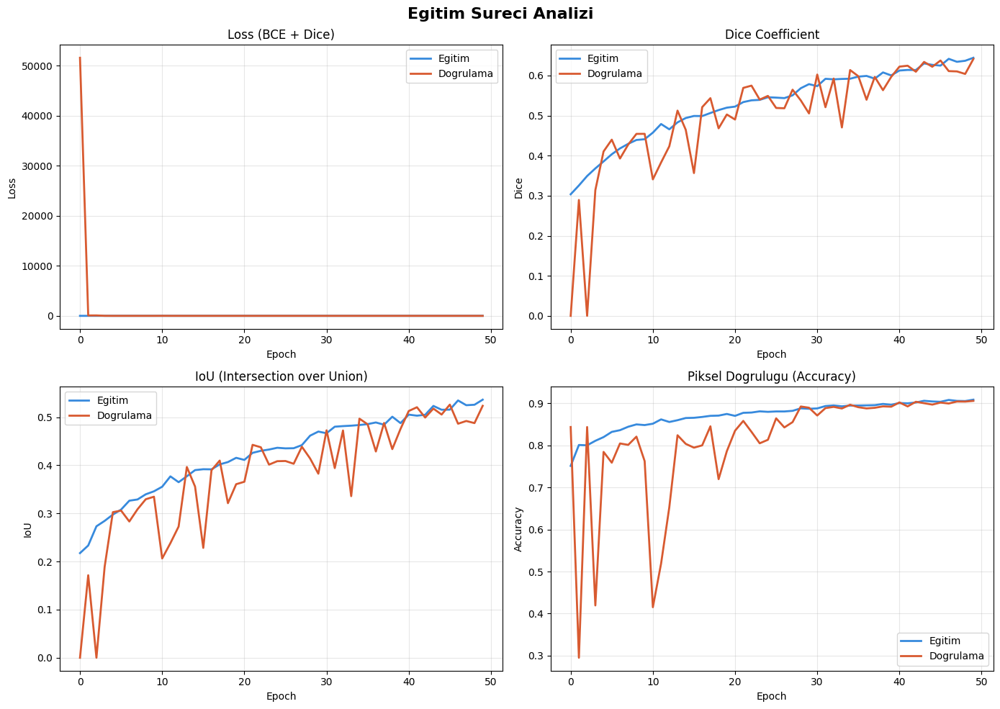

In [ ]:
# ===== EGITIM GRAFIKLERI =====

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Egitim Sureci Analizi', fontsize=16, fontweight='bold')

# 1. Loss
axes[0,0].plot(history.history['loss'], label='Egitim', linewidth=2, color='#378ADD')
axes[0,0].plot(history.history['val_loss'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[0,0].set_title('Loss (BCE + Dice)', fontsize=12)
axes[0,0].set_xlabel('Epoch')
axes[0,0].set_ylabel('Loss')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

# 2. Dice
axes[0,1].plot(history.history['dice_coefficient'], label='Egitim', linewidth=2, color='#378ADD')
axes[0,1].plot(history.history['val_dice_coefficient'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[0,1].set_title('Dice Coefficient', fontsize=12)
axes[0,1].set_xlabel('Epoch')
axes[0,1].set_ylabel('Dice')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

# 3. IoU
axes[1,0].plot(history.history['iou_metric'], label='Egitim', linewidth=2, color='#378ADD')
axes[1,0].plot(history.history['val_iou_metric'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[1,0].set_title('IoU (Intersection over Union)', fontsize=12)
axes[1,0].set_xlabel('Epoch')
axes[1,0].set_ylabel('IoU')
axes[1,0].legend()
axes[1,0].grid(True, alpha=0.3)

# 4. Accuracy
axes[1,1].plot(history.history['accuracy'], label='Egitim', linewidth=2, color='#378ADD')
axes[1,1].plot(history.history['val_accuracy'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[1,1].set_title('Piksel Dogrulugu (Accuracy)', fontsize=12)
axes[1,1].set_xlabel('Epoch')
axes[1,1].set_ylabel('Accuracy')
axes[1,1].legend()
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('egitim_grafikleri.png', dpi=150, bbox_inches='tight')
plt.show()

## 3.6 Test Seti Degerlendirme

In [ ]:
# ===== TEST DEGERLENDIRME =====

print("Test seti degerlendiriliyor...")
results = model.evaluate(test_ds, verbose=1)

print("\n" + "=" * 50)
print("  TEST SONUCLARI")
print("=" * 50)
print(f"  Loss (BCE + Dice):    {results[0]:.4f}")
print(f"  Dice Coefficient:     {results[1]:.4f}")
print(f"  IoU (Jaccard Index):  {results[2]:.4f}")
print(f"  Pixel Accuracy:       {results[3]:.4f}")
print("=" * 50)

Test seti degerlendiriliyor...
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 302ms/step - accuracy: 0.9091 - dice_coefficient: 0.6475 - iou_metric: 0.5301 - loss: 0.5861

  TEST SONUCLARI
  Loss (BCE + Dice):    0.5861
  Dice Coefficient:     0.6475
  IoU (Jaccard Index):  0.5301
  Pixel Accuracy:       0.9091


## 3.7 Tahmin Gorsellestirme

5/5 ━━━━━━━━━━━━━━━━━━━━ 91s 10s/step


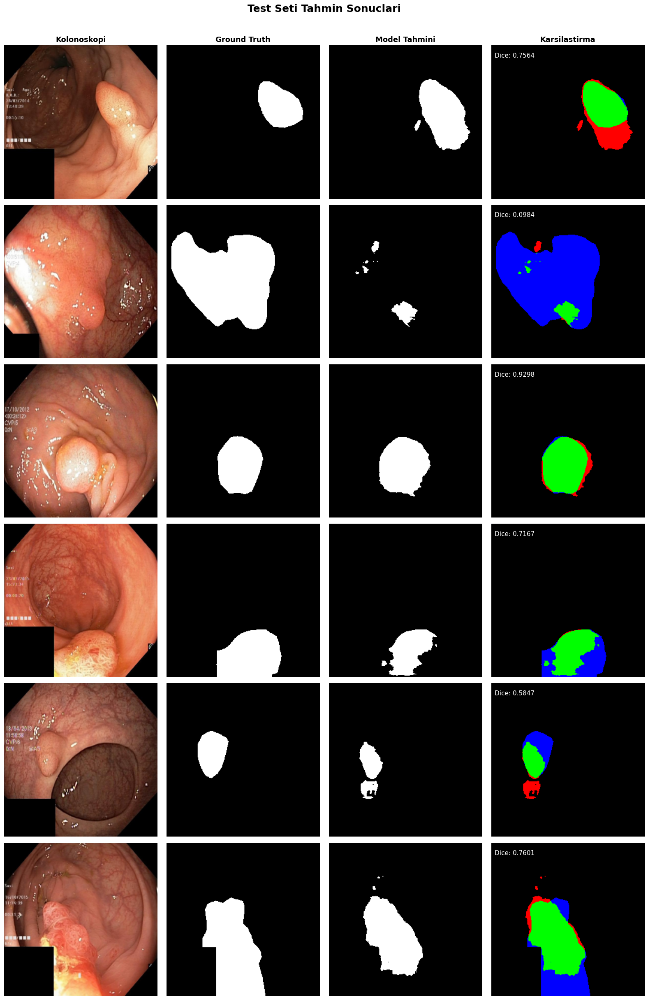

Renk kodlari:
  Yesil  = Dogru tahmin (True Positive)
  Kirmizi = Yanlis tahmin (False Positive)
  Mavi   = Kacirilan alan (False Negative)


In [ ]:
# ===== TAHMIN GORSELLESTIRME =====

# Test setinden tahmin al
predictions = model.predict(X_test)
pred_masks = (predictions > 0.5).astype(np.float32)

# 6 ornek goster
fig, axes = plt.subplots(6, 4, figsize=(16, 24))
fig.suptitle('Test Seti Tahmin Sonuclari', fontsize=18, fontweight='bold', y=1.01)

column_titles = ['Kolonoskopi', 'Ground Truth', 'Model Tahmini', 'Karsilastirma']
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=13, fontweight='bold')

np.random.seed(123)
indices = np.random.choice(len(X_test), 6, replace=False)

for i, idx in enumerate(indices):
    # Orijinal
    axes[i, 0].imshow(X_test[idx])
    axes[i, 0].axis('off')

    # Ground truth
    axes[i, 1].imshow(Y_test[idx, :, :, 0], cmap='gray')
    axes[i, 1].axis('off')

    # Tahmin
    axes[i, 2].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[i, 2].axis('off')

    # Karsilastirma (Yesil=TP, Kirmizi=FP, Mavi=FN)
    gt = Y_test[idx, :, :, 0]
    pred = pred_masks[idx, :, :, 0]
    comparison = np.zeros((IMG_SIZE, IMG_SIZE, 3))
    comparison[:, :, 1] = gt * pred              # Yesil: True Positive
    comparison[:, :, 0] = (1 - gt) * pred        # Kirmizi: False Positive
    comparison[:, :, 2] = gt * (1 - pred)        # Mavi: False Negative
    axes[i, 3].imshow(comparison)
    axes[i, 3].axis('off')

    # Bireysel Dice
    inter = np.sum(gt * pred)
    dice_val = (2. * inter + 1e-6) / (np.sum(gt) + np.sum(pred) + 1e-6)
    axes[i, 3].text(5, 20, f'Dice: {dice_val:.4f}', color='white', fontsize=11,
                     bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

plt.tight_layout()
plt.savefig('tahmin_sonuclari.png', dpi=150, bbox_inches='tight')
plt.show()

print("Renk kodlari:")
print("  Yesil  = Dogru tahmin (True Positive)")
print("  Kirmizi = Yanlis tahmin (False Positive)")
print("  Mavi   = Kacirilan alan (False Negative)")

## 3.8 Detayli Metrik Analizi

In [ ]:
# ===== TUM TEST SETI ICIN DETAYLI METRIKLER =====

dice_scores = []
iou_scores = []

for i in range(len(X_test)):
    gt = Y_test[i, :, :, 0].flatten()
    pred = pred_masks[i, :, :, 0].flatten()

    inter = np.sum(gt * pred)
    dice = (2. * inter + 1e-6) / (np.sum(gt) + np.sum(pred) + 1e-6)
    dice_scores.append(dice)

    union = np.sum(gt) + np.sum(pred) - inter
    iou = (inter + 1e-6) / (union + 1e-6)
    iou_scores.append(iou)

dice_scores = np.array(dice_scores)
iou_scores = np.array(iou_scores)

print("=" * 50)
print("  DETAYLI TEST METRIKLERI")
print("=" * 50)
print(f"  Dice  -> Ort: {dice_scores.mean():.4f} +/- {dice_scores.std():.4f}")
print(f"           Min: {dice_scores.min():.4f} | Max: {dice_scores.max():.4f}")
print(f"  IoU   -> Ort: {iou_scores.mean():.4f} +/- {iou_scores.std():.4f}")
print(f"           Min: {iou_scores.min():.4f} | Max: {iou_scores.max():.4f}")
print("=" * 50)

  DETAYLI TEST METRIKLERI
  Dice  -> Ort: 0.6119 +/- 0.2981
           Min: 0.0000 | Max: 0.9663
  IoU   -> Ort: 0.5010 +/- 0.2845
           Min: 0.0000 | Max: 0.9349


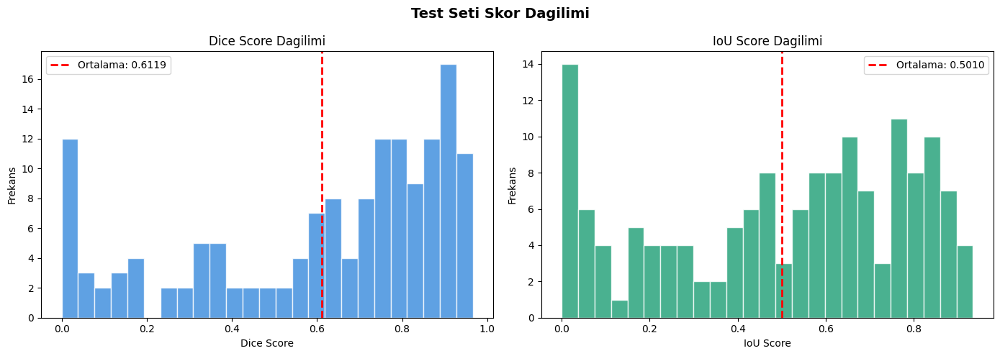

In [ ]:
# ===== SKOR DAGILIMI =====

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Test Seti Skor Dagilimi', fontsize=14, fontweight='bold')

axes[0].hist(dice_scores, bins=25, color='#378ADD', edgecolor='white', alpha=0.8)
axes[0].axvline(dice_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Ortalama: {dice_scores.mean():.4f}')
axes[0].set_title('Dice Score Dagilimi')
axes[0].set_xlabel('Dice Score')
axes[0].set_ylabel('Frekans')
axes[0].legend()

axes[1].hist(iou_scores, bins=25, color='#1D9E75', edgecolor='white', alpha=0.8)
axes[1].axvline(iou_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Ortalama: {iou_scores.mean():.4f}')
axes[1].set_title('IoU Score Dagilimi')
axes[1].set_xlabel('IoU Score')
axes[1].set_ylabel('Frekans')
axes[1].legend()

plt.tight_layout()
plt.savefig('skor_dagilimi.png', dpi=150, bbox_inches='tight')
plt.show()

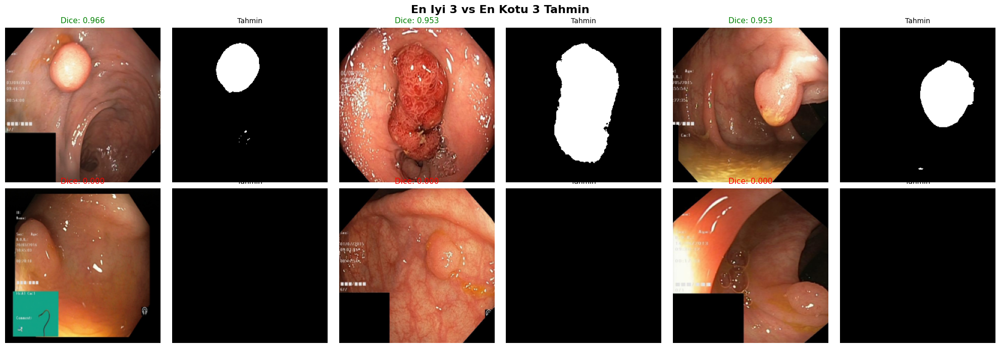

In [ ]:
# ===== EN IYI VE EN KOTU TAHMINLER =====

fig, axes = plt.subplots(2, 6, figsize=(20, 7))
fig.suptitle('En Iyi 3 vs En Kotu 3 Tahmin', fontsize=16, fontweight='bold')

# En iyi 3
best_idx = np.argsort(dice_scores)[-3:][::-1]
for i, idx in enumerate(best_idx):
    axes[0, i*2].imshow(X_test[idx])
    axes[0, i*2].set_title(f'Dice: {dice_scores[idx]:.3f}', color='green', fontsize=11)
    axes[0, i*2].axis('off')
    axes[0, i*2+1].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[0, i*2+1].set_title('Tahmin', fontsize=10)
    axes[0, i*2+1].axis('off')

# En kotu 3
worst_idx = np.argsort(dice_scores)[:3]
for i, idx in enumerate(worst_idx):
    axes[1, i*2].imshow(X_test[idx])
    axes[1, i*2].set_title(f'Dice: {dice_scores[idx]:.3f}', color='red', fontsize=11)
    axes[1, i*2].axis('off')
    axes[1, i*2+1].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[1, i*2+1].set_title('Tahmin', fontsize=10)
    axes[1, i*2+1].axis('off')

axes[0, 0].set_ylabel('EN IYI', fontsize=14, fontweight='bold', color='green')
axes[1, 0].set_ylabel('EN KOTU', fontsize=14, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig('en_iyi_en_kotu.png', dpi=150, bbox_inches='tight')
plt.show()

## 3.9 Final Rapor

In [ ]:
# ===== FINAL RAPOR =====

best_epoch = np.argmax(history.history['val_dice_coefficient']) + 1
best_val_dice = max(history.history['val_dice_coefficient'])
total_epochs = len(history.history['loss'])

print("\n" + "=" * 60)
print("  PROJE SONUC RAPORU")
print("  U-Net ile Polip Segmentasyonu (Kvasir-SEG)")
print("=" * 60)
print(f"")
print(f"  MODEL")
print(f"  Mimari:            U-Net (Encoder-Decoder + Skip Connections)")
print(f"  Parametre:         {model.count_params():,}")
print(f"  Giris:             {IMG_SIZE}x{IMG_SIZE}x3 (RGB)")
print(f"  Cikis:             {IMG_SIZE}x{IMG_SIZE}x1 (Sigmoid)")
print(f"")
print(f"  VERI")
print(f"  Dataset:           Kvasir-SEG (1000 kolonoskopi goruntusu)")
print(f"  Egitim/Val/Test:   700 / 150 / 150")
print(f"  Augmentation:      Flip(H+V), Brightness, Contrast, Saturation")
print(f"")
print(f"  EGITIM")
print(f"  Loss:              BCE + Dice Loss")
print(f"  Optimizer:         Adam (lr=0.001)")
print(f"  Toplam epoch:      {total_epochs}")
print(f"  En iyi epoch:      {best_epoch} (val_dice: {best_val_dice:.4f})")
print(f"")
print(f"  TEST SONUCLARI")
print(f"  Dice Coefficient:  {dice_scores.mean():.4f} +/- {dice_scores.std():.4f}")
print(f"  IoU Score:         {iou_scores.mean():.4f} +/- {iou_scores.std():.4f}")
print(f"  Pixel Accuracy:    {results[3]:.4f}")
print("=" * 60)


  PROJE SONUC RAPORU
  U-Net ile Polip Segmentasyonu (Kvasir-SEG)

  MODEL
  Mimari:            U-Net (Encoder-Decoder + Skip Connections)
  Parametre:         31,055,297
  Giris:             256x256x3 (RGB)
  Cikis:             256x256x1 (Sigmoid)

  VERI
  Dataset:           Kvasir-SEG (1000 kolonoskopi goruntusu)
  Egitim/Val/Test:   700 / 150 / 150
  Augmentation:      Flip(H+V), Brightness, Contrast, Saturation

  EGITIM
  Loss:              BCE + Dice Loss
  Optimizer:         Adam (lr=0.001)
  Toplam epoch:      50
  En iyi epoch:      50 (val_dice: 0.6414)

  TEST SONUCLARI
  Dice Coefficient:  0.6119 +/- 0.2981
  IoU Score:         0.5010 +/- 0.2845
  Pixel Accuracy:    0.9091


In [ ]:
# Modeli kaydet
model.save('unet_polyp_segmentation_final.keras')
print("Model 'unet_polyp_segmentation_final.keras' olarak kaydedildi.")

# Google Drive'a kaydetmek icin:
# from google.colab import drive
# drive.mount('/content/drive')
# model.save('/content/drive/MyDrive/unet_polyp_segmentation_final.keras')
# print("Model Drive'a kaydedildi.")

Model 'unet_polyp_segmentation_final.keras' olarak kaydedildi.


# Adim 3 v2: Iyilestirilmis U-Net Egitimi
## U-Net ile Polip Segmentasyonu - Final Projesi

### v1'den farklar:
- Learning rate: 1e-3 → **1e-4** (ilk epoch'lardaki kararsizlik cozuldu)
- Epoch: 50 → **100** (model ogrenmeye devam ediyordu)
- **Cosine Decay** lr scheduler (kademeli dusus)
- Augmentation: **Rotation** eklendi
- EarlyStopping patience: 10 → **15**

Hedef: **Dice 0.85+**

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split
import albumentations as A
import warnings
warnings.filterwarnings('ignore')

# ===== SABITLER (v2) =====
IMG_SIZE = 256
BATCH_SIZE = 16
EPOCHS = 100          # v1: 50 -> v2: 100
INIT_LR = 1e-4        # v1: 1e-3 -> v2: 1e-4 (kararsizligi cozer)
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Yollar
IMAGE_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/images/'
MASK_DIR = 'kvasir_seg/Kvasir-SEG/Kvasir-SEG/masks/'
image_paths = sorted(glob(IMAGE_DIR + '*.jpg') + glob(IMAGE_DIR + '*.png'))
mask_paths = sorted(glob(MASK_DIR + '*.jpg') + glob(MASK_DIR + '*.png'))

print(f"TF: {tf.__version__} | GPU: {tf.config.list_physical_devices('GPU')}")
print(f"Goruntu: {len(image_paths)}, Maske: {len(mask_paths)}")
print(f"\nv2 Degisiklikler: lr={INIT_LR}, epochs={EPOCHS}")

TF: 2.20.0 | GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Goruntu: 0, Maske: 0

v2 Degisiklikler: lr=0.0001, epochs=100


In [ ]:
# On isleme (Adim 2 ile ayni)
def load_and_preprocess(image_path, mask_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask.astype(np.float32) / 255.0
    mask = (mask > 0.5).astype(np.float32)
    return img, mask

print("Veriler yukleniyor...")
X_data, Y_data = [], []
for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=len(image_paths)):
    img, mask = load_and_preprocess(img_path, mask_path)
    X_data.append(img)
    Y_data.append(mask)
X_data = np.array(X_data)
Y_data = np.array(Y_data)[..., np.newaxis]

# Split
X_train, X_temp, Y_train, Y_temp = train_test_split(X_data, Y_data, test_size=0.30, random_state=SEED)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.50, random_state=SEED)

print(f"Egitim: {X_train.shape[0]}, Val: {X_val.shape[0]}, Test: {X_test.shape[0]}")

Veriler yukleniyor...


100%|██████████| 1000/1000 [00:10<00:00, 92.99it/s]


Egitim: 700, Val: 150, Test: 150


## 3.1 Guclendirilmis Augmentation (v2)

v1'e ek olarak:
- **Rotation** (+-30 derece): Polip her acidan gorunebilir
- **Elastic Transform**: Hafif deforme -> model kenar degisimlerine dayanikli olur
- **Albumentations** kutuphanesi: Daha guclu ve hizli augmentation

In [ ]:
# ===== ALBUMENTATIONS AUGMENTATION (v2) =====

aug_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=30, p=0.5, border_mode=cv2.BORDER_REFLECT),
    A.ElasticTransform(alpha=50, sigma=10, p=0.2),
    A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.5),
    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.3),
    A.GaussianBlur(blur_limit=(3, 5), p=0.2),
])


def augment_albumentations(image, mask):
    """Numpy array uzerinde albumentations augmentation uygula."""
    augmented = aug_transform(
        image=(image * 255).astype(np.uint8),
        mask=(mask[:, :, 0] * 255).astype(np.uint8)
    )
    aug_img = augmented['image'].astype(np.float32) / 255.0
    aug_mask = (augmented['mask'] > 127).astype(np.float32)
    return aug_img, aug_mask[..., np.newaxis]


def tf_augment(image, mask):
    """tf.data pipeline icinde augmentation wrapper."""
    def _augment(img, msk):
        aug_img, aug_msk = augment_albumentations(img.numpy(), msk.numpy())
        return aug_img, aug_msk

    image, mask = tf.py_function(
        _augment,
        [image, mask],
        [tf.float32, tf.float32]
    )
    image.set_shape([IMG_SIZE, IMG_SIZE, 3])
    mask.set_shape([IMG_SIZE, IMG_SIZE, 1])
    return image, mask


print("v2 Augmentation tanimlandi:")
print("  + HorizontalFlip, VerticalFlip")
print("  + Rotation (+-30)")
print("  + ElasticTransform")
print("  + RandomBrightnessContrast")
print("  + HueSaturationValue")
print("  + GaussianBlur")

v2 Augmentation tanimlandi:
  + HorizontalFlip, VerticalFlip
  + Rotation (+-30)
  + ElasticTransform
  + RandomBrightnessContrast
  + HueSaturationValue
  + GaussianBlur


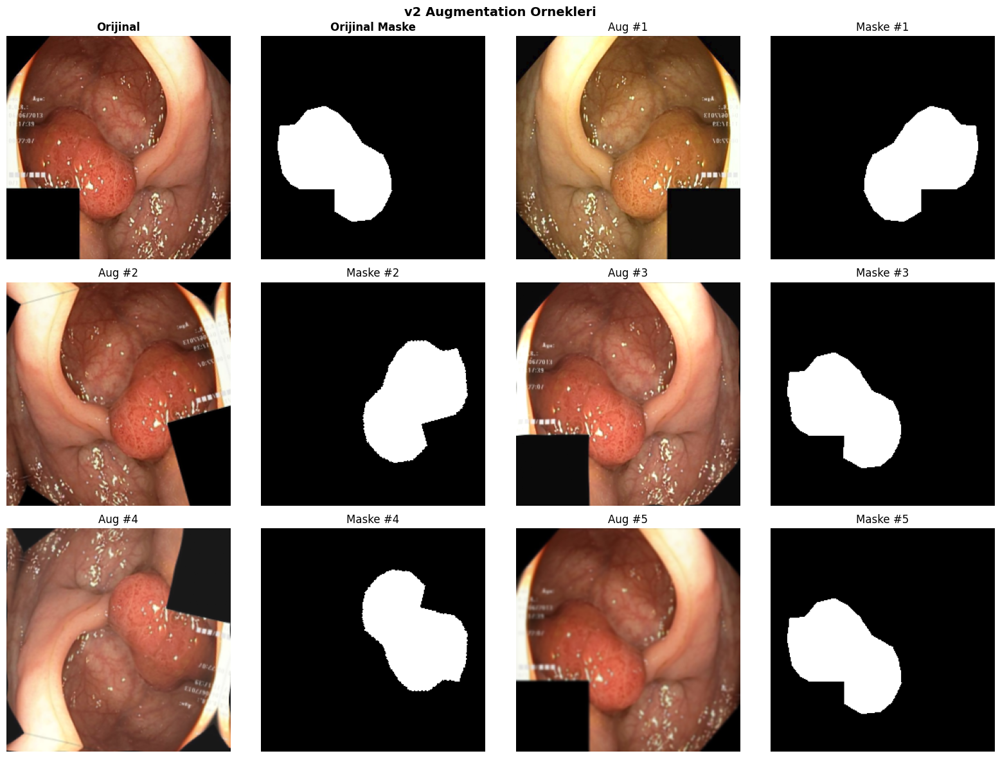

In [ ]:
# Augmentation gorsel kontrolu
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('v2 Augmentation Ornekleri', fontsize=14, fontweight='bold')

sample_img = X_train[0]
sample_mask = Y_train[0]

axes[0, 0].imshow(sample_img)
axes[0, 0].set_title('Orijinal', fontweight='bold')
axes[0, 0].axis('off')
axes[0, 1].imshow(sample_mask[:,:,0], cmap='gray')
axes[0, 1].set_title('Orijinal Maske', fontweight='bold')
axes[0, 1].axis('off')

positions = [(0,2),(0,3),(1,0),(1,1),(1,2),(1,3),(2,0),(2,1),(2,2),(2,3)]
for k in range(5):
    aug_img, aug_mask = augment_albumentations(sample_img, sample_mask)
    r, c = positions[k*2], positions[k*2+1]
    axes[r[0], r[1]].imshow(aug_img)
    axes[r[0], r[1]].set_title(f'Aug #{k+1}')
    axes[r[0], r[1]].axis('off')
    axes[c[0], c[1]].imshow(aug_mask[:,:,0], cmap='gray')
    axes[c[0], c[1]].set_title(f'Maske #{k+1}')
    axes[c[0], c[1]].axis('off')

plt.tight_layout()
plt.savefig('v2_augmentation.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# ===== TF.DATA PIPELINE (v2) =====

train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = (
    train_ds
    .shuffle(500, seed=SEED)
    .map(tf_augment, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test)).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

print("Pipeline hazir!")

Pipeline hazir!


## 3.2 U-Net Modeli (ayni mimari)

In [ ]:
def conv_block(inputs, num_filters):
    x = layers.Conv2D(num_filters, 3, padding='same', kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(num_filters, 3, padding='same', kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def encoder_block(inputs, num_filters):
    skip = conv_block(inputs, num_filters)
    pool = layers.MaxPooling2D(2)(skip)
    pool = layers.Dropout(0.2)(pool)
    return skip, pool

def decoder_block(inputs, skip_connection, num_filters):
    x = layers.Conv2DTranspose(num_filters, 2, strides=2, padding='same')(inputs)
    x = layers.Concatenate()([x, skip_connection])
    x = layers.Dropout(0.2)(x)
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    skip1, pool1 = encoder_block(inputs, 64)
    skip2, pool2 = encoder_block(pool1, 128)
    skip3, pool3 = encoder_block(pool2, 256)
    skip4, pool4 = encoder_block(pool3, 512)

    # Bottleneck
    bottleneck = conv_block(pool4, 1024)

    # Decoder
    d1 = decoder_block(bottleneck, skip4, 512)
    d2 = decoder_block(d1, skip3, 256)
    d3 = decoder_block(d2, skip2, 128)
    d4 = decoder_block(d3, skip1, 64)

    outputs = layers.Conv2D(1, 1, activation='sigmoid')(d4)

    model = Model(inputs, outputs, name='U-Net-v2')
    return model

model = build_unet()
print(f"Model: {model.name} | Parametre: {model.count_params():,}")

Model: U-Net-v2 | Parametre: 31,055,297


## 3.3 Loss, Metrikler ve Cosine Decay (v2)

In [ ]:
# ===== LOSS ve METRIKLER =====

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
        tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth
    )

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_loss(y_true, y_pred)
    return bce + dice

def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.keras.backend.sum(y_true * y_pred_bin)
    union = tf.keras.backend.sum(y_true) + tf.keras.backend.sum(y_pred_bin) - intersection
    return (intersection + smooth) / (union + smooth)

print("Loss ve metrikler tanimlandi.")

Loss ve metrikler tanimlandi.


In [ ]:
# ===== COSINE DECAY LR SCHEDULER (v2) =====
# lr kademeli olarak duser: baslangicta hizli ogrenir, sonra ince ayar yapar

steps_per_epoch = len(X_train) // BATCH_SIZE
total_steps = steps_per_epoch * EPOCHS

lr_schedule = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=INIT_LR,
    decay_steps=total_steps,
    alpha=1e-6  # minimum lr
)

# Model derleme
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    loss=bce_dice_loss,
    metrics=[dice_coefficient, iou_metric, 'accuracy']
)

print(f"v2 Optimizer: Adam + Cosine Decay")
print(f"  Baslangic lr: {INIT_LR}")
print(f"  Minimum lr:   1e-6")
print(f"  Toplam step:  {total_steps}")

v2 Optimizer: Adam + Cosine Decay
  Baslangic lr: 0.0001
  Minimum lr:   1e-6
  Toplam step:  4300


In [ ]:
# ===== CALLBACKS (v2) =====

callbacks = [
    ModelCheckpoint(
        'best_unet_polyp_v2.keras',
        monitor='val_dice_coefficient',
        mode='max',
        save_best_only=True,
        verbose=1
    ),
    EarlyStopping(
        monitor='val_dice_coefficient',
        mode='max',
        patience=15,     # v1: 10 -> v2: 15
        restore_best_weights=True,
        verbose=1
    )
    # ReduceLROnPlateau kaldirildi: Cosine Decay kullaniyoruz
]

print("v2 Callbacks:")
print("  1. ModelCheckpoint (en iyi model)")
print("  2. EarlyStopping (patience=15)")
print("  * ReduceLROnPlateau kaldirildi, Cosine Decay lr yonetiyor")

v2 Callbacks:
  1. ModelCheckpoint (en iyi model)
  2. EarlyStopping (patience=15)
  * ReduceLROnPlateau kaldirildi, Cosine Decay lr yonetiyor


## 3.4 Egitim (v2)

In [ ]:
print("=" * 60)
print("  EGITIM BASLIYOR (v2 - Iyilestirilmis)")
print("=" * 60)
print(f"  Epochs:          {EPOCHS}")
print(f"  Batch size:      {BATCH_SIZE}")
print(f"  Learning rate:   {INIT_LR} (Cosine Decay)")
print(f"  Egitim ornegi:   {X_train.shape[0]}")
print(f"  Dogrulama:       {X_val.shape[0]}")
print(f"  Augmentation:    Albumentations (Flip+Rot+Elastic+Color)")
print("=" * 60)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)

print("\nEgitim tamamlandi!")

  EGITIM BASLIYOR (v2 - Iyilestirilmis)
  Epochs:          100
  Batch size:      16
  Learning rate:   0.0001 (Cosine Decay)
  Egitim ornegi:   700
  Dogrulama:       150
  Augmentation:    Albumentations (Flip+Rot+Elastic+Color)
Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6398 - dice_coefficient: 0.2966 - iou_metric: 0.2216 - loss: 1.3703
Epoch 1: val_dice_coefficient improved from None to 0.31402, saving model to best_unet_polyp_v2.keras

Epoch 1: finished saving model to best_unet_polyp_v2.keras
44/44 ━━━━━━━━━━━━━━━━━━━━ 267s 4s/step - accuracy: 0.6738 - dice_coefficient: 0.3025 - iou_metric: 0.2379 - loss: 1.3004 - val_accuracy: 0.3353 - val_dice_coefficient: 0.3140 - val_iou_metric: 0.1898 - val_loss: 9.1154
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7389 - dice_coefficient: 0.3107 - iou_metric: 0.2404 - loss: 1.1589
Epoch 2: val_dice_coefficient did not improve from 0.31402
44/44 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.7583 - dice

## 3.5 Egitim Grafikleri

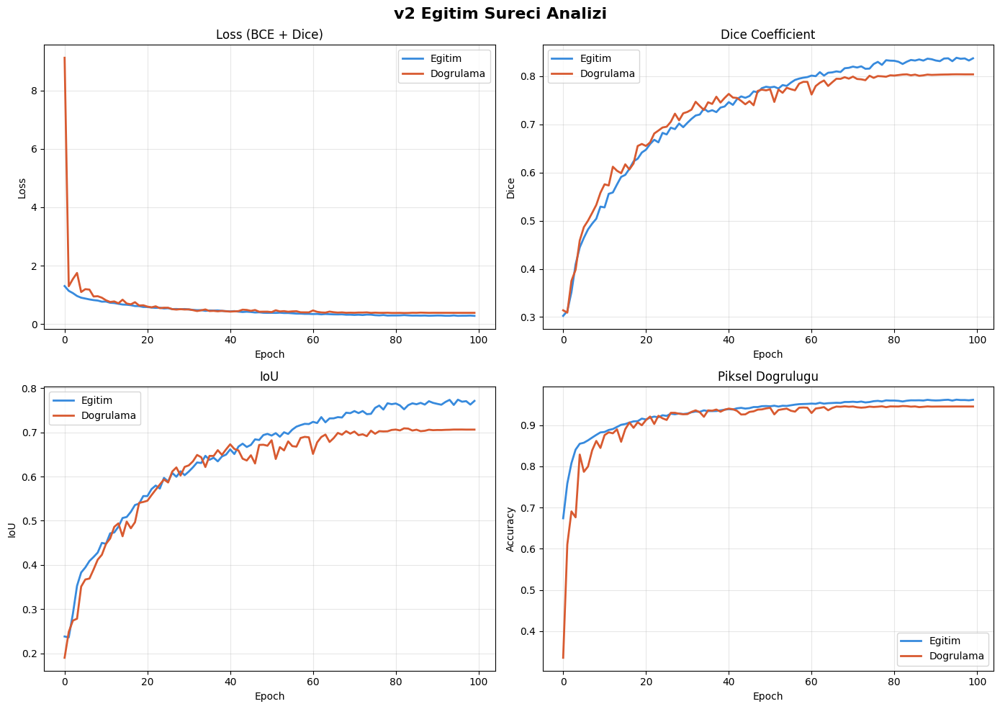

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('v2 Egitim Sureci Analizi', fontsize=16, fontweight='bold')

# Loss
axes[0,0].plot(history.history['loss'], label='Egitim', linewidth=2, color='#378ADD')
axes[0,0].plot(history.history['val_loss'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[0,0].set_title('Loss (BCE + Dice)')
axes[0,0].set_xlabel('Epoch')
axes[0,0].set_ylabel('Loss')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

# Dice
axes[0,1].plot(history.history['dice_coefficient'], label='Egitim', linewidth=2, color='#378ADD')
axes[0,1].plot(history.history['val_dice_coefficient'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[0,1].set_title('Dice Coefficient')
axes[0,1].set_xlabel('Epoch')
axes[0,1].set_ylabel('Dice')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

# IoU
axes[1,0].plot(history.history['iou_metric'], label='Egitim', linewidth=2, color='#378ADD')
axes[1,0].plot(history.history['val_iou_metric'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[1,0].set_title('IoU')
axes[1,0].set_xlabel('Epoch')
axes[1,0].set_ylabel('IoU')
axes[1,0].legend()
axes[1,0].grid(True, alpha=0.3)

# Accuracy
axes[1,1].plot(history.history['accuracy'], label='Egitim', linewidth=2, color='#378ADD')
axes[1,1].plot(history.history['val_accuracy'], label='Dogrulama', linewidth=2, color='#D85A30')
axes[1,1].set_title('Piksel Dogrulugu')
axes[1,1].set_xlabel('Epoch')
axes[1,1].set_ylabel('Accuracy')
axes[1,1].legend()
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('v2_egitim_grafikleri.png', dpi=150, bbox_inches='tight')
plt.show()

## 3.6 Test Seti Degerlendirme

In [ ]:
print("Test seti degerlendiriliyor...")
results = model.evaluate(test_ds, verbose=1)

print("\n" + "=" * 50)
print("  v2 TEST SONUCLARI")
print("=" * 50)
print(f"  Loss (BCE + Dice):    {results[0]:.4f}")
print(f"  Dice Coefficient:     {results[1]:.4f}")
print(f"  IoU (Jaccard Index):  {results[2]:.4f}")
print(f"  Pixel Accuracy:       {results[3]:.4f}")
print("=" * 50)

Test seti degerlendiriliyor...
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 343ms/step - accuracy: 0.9455 - dice_coefficient: 0.7977 - iou_metric: 0.6955 - loss: 0.3687

  v2 TEST SONUCLARI
  Loss (BCE + Dice):    0.3687
  Dice Coefficient:     0.7977
  IoU (Jaccard Index):  0.6955
  Pixel Accuracy:       0.9455


## 3.7 Tahmin Gorsellestirme

5/5 ━━━━━━━━━━━━━━━━━━━━ 95s 10s/step


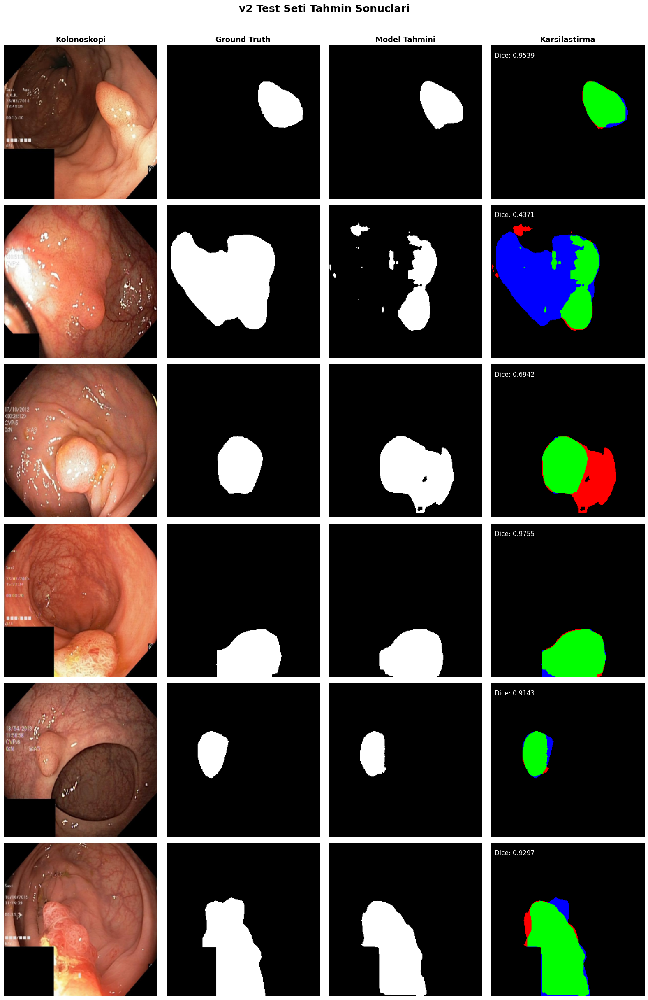

Yesil=TP | Kirmizi=FP | Mavi=FN


In [ ]:
predictions = model.predict(X_test)
pred_masks = (predictions > 0.5).astype(np.float32)

fig, axes = plt.subplots(6, 4, figsize=(16, 24))
fig.suptitle('v2 Test Seti Tahmin Sonuclari', fontsize=18, fontweight='bold', y=1.01)

column_titles = ['Kolonoskopi', 'Ground Truth', 'Model Tahmini', 'Karsilastirma']
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=13, fontweight='bold')

np.random.seed(123)
indices = np.random.choice(len(X_test), 6, replace=False)

for i, idx in enumerate(indices):
    axes[i, 0].imshow(X_test[idx])
    axes[i, 0].axis('off')

    axes[i, 1].imshow(Y_test[idx, :, :, 0], cmap='gray')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[i, 2].axis('off')

    gt = Y_test[idx, :, :, 0]
    pred = pred_masks[idx, :, :, 0]
    comparison = np.zeros((IMG_SIZE, IMG_SIZE, 3))
    comparison[:, :, 1] = gt * pred
    comparison[:, :, 0] = (1 - gt) * pred
    comparison[:, :, 2] = gt * (1 - pred)
    axes[i, 3].imshow(comparison)
    axes[i, 3].axis('off')

    inter = np.sum(gt * pred)
    dice_val = (2. * inter + 1e-6) / (np.sum(gt) + np.sum(pred) + 1e-6)
    axes[i, 3].text(5, 20, f'Dice: {dice_val:.4f}', color='white', fontsize=11,
                     bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

plt.tight_layout()
plt.savefig('v2_tahmin_sonuclari.png', dpi=150, bbox_inches='tight')
plt.show()

print("Yesil=TP | Kirmizi=FP | Mavi=FN")

## 3.8 Detayli Metrik Analizi

In [ ]:
dice_scores = []
iou_scores = []

for i in range(len(X_test)):
    gt = Y_test[i, :, :, 0].flatten()
    pred = pred_masks[i, :, :, 0].flatten()
    inter = np.sum(gt * pred)
    dice = (2. * inter + 1e-6) / (np.sum(gt) + np.sum(pred) + 1e-6)
    dice_scores.append(dice)
    union = np.sum(gt) + np.sum(pred) - inter
    iou = (inter + 1e-6) / (union + 1e-6)
    iou_scores.append(iou)

dice_scores = np.array(dice_scores)
iou_scores = np.array(iou_scores)

print("=" * 55)
print("  v2 DETAYLI TEST METRIKLERI")
print("=" * 55)
print(f"  Dice  -> Ort: {dice_scores.mean():.4f} +/- {dice_scores.std():.4f}")
print(f"           Min: {dice_scores.min():.4f} | Max: {dice_scores.max():.4f}")
print(f"  IoU   -> Ort: {iou_scores.mean():.4f} +/- {iou_scores.std():.4f}")
print(f"           Min: {iou_scores.min():.4f} | Max: {iou_scores.max():.4f}")
print(f"\n  Dice > 0.8 olan goruntu sayisi: {np.sum(dice_scores > 0.8)} / {len(dice_scores)}")
print(f"  Dice < 0.3 olan goruntu sayisi: {np.sum(dice_scores < 0.3)} / {len(dice_scores)}")
print("=" * 55)

  v2 DETAYLI TEST METRIKLERI
  Dice  -> Ort: 0.8113 +/- 0.2063
           Min: 0.0000 | Max: 0.9841
  IoU   -> Ort: 0.7211 +/- 0.2269
           Min: 0.0000 | Max: 0.9686

  Dice > 0.8 olan goruntu sayisi: 108 / 150
  Dice < 0.3 olan goruntu sayisi: 6 / 150


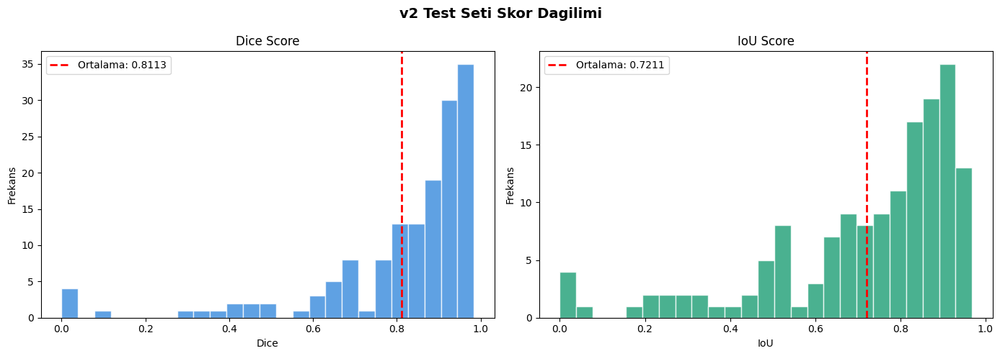

In [ ]:
# Skor dagilimi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('v2 Test Seti Skor Dagilimi', fontsize=14, fontweight='bold')

axes[0].hist(dice_scores, bins=25, color='#378ADD', edgecolor='white', alpha=0.8)
axes[0].axvline(dice_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Ortalama: {dice_scores.mean():.4f}')
axes[0].set_title('Dice Score')
axes[0].set_xlabel('Dice')
axes[0].set_ylabel('Frekans')
axes[0].legend()

axes[1].hist(iou_scores, bins=25, color='#1D9E75', edgecolor='white', alpha=0.8)
axes[1].axvline(iou_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Ortalama: {iou_scores.mean():.4f}')
axes[1].set_title('IoU Score')
axes[1].set_xlabel('IoU')
axes[1].set_ylabel('Frekans')
axes[1].legend()

plt.tight_layout()
plt.savefig('v2_skor_dagilimi.png', dpi=150, bbox_inches='tight')
plt.show()

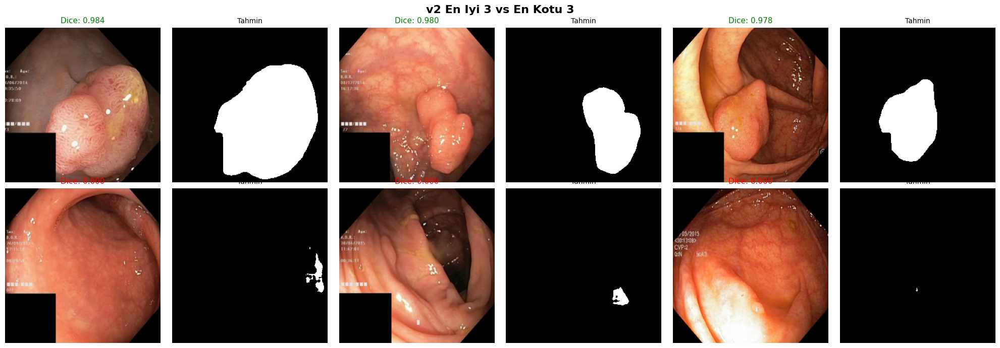

In [ ]:
# En iyi 3 vs En kotu 3
fig, axes = plt.subplots(2, 6, figsize=(20, 7))
fig.suptitle('v2 En Iyi 3 vs En Kotu 3', fontsize=16, fontweight='bold')

best_idx = np.argsort(dice_scores)[-3:][::-1]
for i, idx in enumerate(best_idx):
    axes[0, i*2].imshow(X_test[idx])
    axes[0, i*2].set_title(f'Dice: {dice_scores[idx]:.3f}', color='green', fontsize=11)
    axes[0, i*2].axis('off')
    axes[0, i*2+1].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[0, i*2+1].set_title('Tahmin', fontsize=10)
    axes[0, i*2+1].axis('off')

worst_idx = np.argsort(dice_scores)[:3]
for i, idx in enumerate(worst_idx):
    axes[1, i*2].imshow(X_test[idx])
    axes[1, i*2].set_title(f'Dice: {dice_scores[idx]:.3f}', color='red', fontsize=11)
    axes[1, i*2].axis('off')
    axes[1, i*2+1].imshow(pred_masks[idx, :, :, 0], cmap='gray')
    axes[1, i*2+1].set_title('Tahmin', fontsize=10)
    axes[1, i*2+1].axis('off')

axes[0, 0].set_ylabel('EN IYI', fontsize=14, fontweight='bold', color='green')
axes[1, 0].set_ylabel('EN KOTU', fontsize=14, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig('v2_en_iyi_en_kotu.png', dpi=150, bbox_inches='tight')
plt.show()

## 3.9 v1 vs v2 Karsilastirma ve Final Rapor

In [ ]:
best_epoch = np.argmax(history.history['val_dice_coefficient']) + 1
best_val_dice = max(history.history['val_dice_coefficient'])
total_epochs = len(history.history['loss'])

print("\n" + "=" * 65)
print("  v1 vs v2 KARSILASTIRMA")
print("=" * 65)
print(f"  {'Metrik':<25} {'v1':>10} {'v2':>10} {'Fark':>10}")
print("-" * 65)
print(f"  {'Learning Rate':<25} {'1e-3':>10} {'1e-4':>10} {'10x dusuk':>10}")
print(f"  {'Epochs':<25} {'50':>10} {total_epochs:>10}")
print(f"  {'LR Scheduler':<25} {'ReduceLR':>10} {'CosDec':>10}")
print(f"  {'Augmentation':<25} {'TF basic':>10} {'Album.':>10}")
print(f"  {'Test Dice':<25} {'0.6119':>10} {dice_scores.mean():>10.4f}")
print(f"  {'Test IoU':<25} {'0.5010':>10} {iou_scores.mean():>10.4f}")
print(f"  {'Pixel Accuracy':<25} {'0.9091':>10} {results[3]:>10.4f}")
print("=" * 65)

print(f"\n" + "=" * 65)
print("  FINAL PROJE RAPORU")
print("  U-Net ile Polip Segmentasyonu (Kvasir-SEG)")
print("=" * 65)
print(f"  Model:             U-Net (31M parametre)")
print(f"  Dataset:           Kvasir-SEG (1000 goruntu)")
print(f"  Split:             700 / 150 / 150")
print(f"  Loss:              BCE + Dice Loss")
print(f"  Optimizer:         Adam + Cosine Decay (lr={INIT_LR})")
print(f"  En iyi epoch:      {best_epoch} (val_dice: {best_val_dice:.4f})")
print(f"  Test Dice:         {dice_scores.mean():.4f} +/- {dice_scores.std():.4f}")
print(f"  Test IoU:          {iou_scores.mean():.4f} +/- {iou_scores.std():.4f}")
print(f"  Pixel Accuracy:    {results[3]:.4f}")
print("=" * 65)


  v1 vs v2 KARSILASTIRMA
  Metrik                            v1         v2       Fark
-----------------------------------------------------------------
  Learning Rate                   1e-3       1e-4  10x dusuk
  Epochs                            50        100
  LR Scheduler                ReduceLR     CosDec
  Augmentation                TF basic     Album.
  Test Dice                     0.6119     0.8113
  Test IoU                      0.5010     0.7211
  Pixel Accuracy                0.9091     0.9455

  FINAL PROJE RAPORU
  U-Net ile Polip Segmentasyonu (Kvasir-SEG)
  Model:             U-Net (31M parametre)
  Dataset:           Kvasir-SEG (1000 goruntu)
  Split:             700 / 150 / 150
  Loss:              BCE + Dice Loss
  Optimizer:         Adam + Cosine Decay (lr=0.0001)
  En iyi epoch:      96 (val_dice: 0.8036)
  Test Dice:         0.8113 +/- 0.2063
  Test IoU:          0.7211 +/- 0.2269
  Pixel Accuracy:    0.9455


In [ ]:
# Model kaydet
model.save('unet_polyp_v2_final.keras')
print("Model 'unet_polyp_v2_final.keras' olarak kaydedildi.")

# Drive'a kaydet (tavsiye)
# from google.colab import drive
# drive.mount('/content/drive')
# model.save('/content/drive/MyDrive/unet_polyp_v2_final.keras')
# print("Drive'a kaydedildi.")

Model 'unet_polyp_v2_final.keras' olarak kaydedildi.
